In [1]:
import re
import warnings
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')

In [2]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
stopwords = stopwords.words('english')

In [3]:
dont_include = ['preparing','special','secondary','role','made','modern','achieved','complete','bank','position','size','trust','responsibility','project','require','requirements','requirement','chennai','pune','bachelor','achievements', 'projects', 'experience', 'skills', 'certifications', 'education', 'references', 'languages', 'hobbies', 'interests','details', 'university', 'exprience','experience', 'january', 'company', 'maharashtra', 'description', 'skill', 'less', 'year', 'months', 'mumbai', 'pune', 'college', 'cases', 'high', 'education', 'monthscompany', 'india', 'work', 'skills', 'working', 'responsibilities', 'projects', 'new', 'nagpur', 'team', 'international', 'using', 'good', 'system', 'involved', 'environment', 'knowledge', 'functional', 'documents', '2014', '2017', 'worked', 'build', 'product', 'based', 'used', 'requirements', 'process', 'user', 'various', 'report', 'client', 'ltd', 'processes', 'pvt', 'maintain', 'documentation', 'ms', 'inspection', 'drawings', 'quality', 'name', 'etc', 'job', 'ensure', 'like', 'sap', 'technical', 'hana', 'backup', 'installation', 'issues', 'support', 'windows', 'creating', 'users', 'different', 'technologies', 'role', 'power', 'control', 'completed', 'per', 'activities', 'june', 'school', 'training', 'office', 'handling', 'customers', 'customer', 'manager', 'time', 'order', 'ãâ', 'delivery', 'reports', 'performance']

In [4]:
unified_list = [
    'web', 'design', 'website', 'development', 'application', 'service', 'management', 'developer', 'designer', 'software', 
    'developed', 'site', 'marketing', 'business', 'html', 'content', 'state', 'cs', 'javascript', 'data', 'created', 'graphic', 
    'city', 'system', 'client', 'testing', 'test', 'patient', 'care', 'plan', 'procedure', 'information', 'student', 'tool', 
    'security', 'professional', 'staff', 'program', 'equipment', 'medical', 'sale', 'product', 'need', 'relationship', 'account', 
    'maintained', 'store', 'strategy', 'merchandise', 'communication', 'goal', 'revenue', 'inventory', 'market', 'area', 'current', 
    'sql', 'database', 'server', 'ssis', 'query', 'package', 'table', 'oracle', 'production', 'stored', 'solution', 'ssrs', 'tuning', 
    'implementation', 'abap', 'consultant', 'analysis', 'module', 'master', 'integration', 'configuration', 'react', 'spring', 
    'code', 'java', 'implemented', 'framework', 'python', 'aws', 'django', 'medium', 'public', 'relation', 'event', 'social', 
    'press', 'including', 'pr', 'community', 'campaign', 'pmo', 'operation', 'budget', 'resource', 'improvement', 'risk', 'change', 
    'leadership', 'financial', 'agile', 'employee', 'policy', 'daily', 'safety', 'operational', 'cost', 'member', 'network', 
    'cisco', 'firewall', 'engineer', 'switch', 'troubleshooting', 'router', 'infrastructure', 'access', 'hardware', 'device', 
    'routing', 'mechanical', 'engineering', 'manufacturing', 'maintenance', 'component', 'material', 'machine', 'part', 'solidworks', 
    'designed', 'specification', 'record', 'technology', 'computer', 'problem', 'hr', 'human', 'benefit', 'payroll', 'recruitment', 
    'compensation', 'department', 'compliance', 'fitness', 'health', 'exercise', 'group', 'personal', 'class', 'wellness', 'nutrition', 
    'trainer', 'certified', 'food', 'beverage', 'guest', 'restaurant', 'menu', 'standard', 'item', 'hotel', 'order', 'satisfaction', 
    'finance', 'accounting', 'tax', 'reconciliation', 'statement', 'prepared', 'audit', 'entry', 'payment', 'electrical', 'repair', 
    'wiring', 'circuit', 'installed', 'electrician', 'teacher', 'learning', 'classroom', 'lesson', 'teaching', 'educational', 
    'instruction', 'curriculum', 'positive', 'child', 'parent', 'behavior', 'etl', 'informatica', 'source', 'mapping', 'warehouse', 
    'file', 'net', 'aspnet', 'c', 'jquery', 'digital', 'brand', 'creative', 'google', 'devops', 'cloud', 'deployment', 'jenkins', 
    'docker', 'continuous', 'linux', 'azure', 'pipeline', 'git', 'automation', 'art', 'adobe', 'interior', 'recovery', 'administrator', 
    'monitoring', 'microsoft', 'science', 'model', 'research', 'year', 'scientist', 'civil', 'construction', 'building', 'water', 
    'analyst', 'stakeholder', 'use', 'diagram', 'worker', 'contractor', 'schedule', 'blockchain', 'faculty', 'contract', 'smart', 
    'york', 'banking', 'branch', 'loan', 'credit', 'cash', 'call', 'center', 'agent', 'aircraft', 'aviation', 'flight', 'pilot', 
    'personnel', 'vehicle', 'automotive', 'claim', 'director', 'english', 'language', 'grade', 'architect', 'architecture', 
    'architectural', 'planning', 'apparel', 'associate', 'display', 'organized', 'floor', 'merchandising', 'fashion', 'agricultural', 
    'farm', 'crop', 'agriculture', 'plant', 'advocate', 'legal', 'victim', 'family', 'provided'
]

In [5]:
# df = pd.read_csv(r'../data/UpdatedResumeDataSet.csv')
df = pd.read_csv(r'../data/Dataset.txt')
df.rename(columns={'Text': 'Resume'}, inplace=True)
df.head(2)

,Category,Resume
0,Accountant,﻿________________\r\n\r\nEDUCATION\r\nOMBA - E...
1,Accountant,﻿________________\r\n\r\nHOWARD GERRARD\r\nAcc...


In [6]:
df['Resume'].drop_duplicates()
df['Category'].value_counts()

Category
Education                    410
Mechanical Engineer          384
Electrical Engineering       384
Consultant                   368
Civil Engineer               364
Sales                        364
Management                   361
Human Resources              360
Digital Media                358
Accountant                   350
Java Developer               348
Building and Construction    345
Operations Manager           345
Architecture                 344
Testing                      344
Business Analyst             340
Aviation                     340
Finance                      339
SQL Developer                338
Public Relations             337
Health and Fitness           332
Arts                         332
Network Security Engineer    330
DotNet Developer             329
Apparel                      320
Banking                      314
Automobile                   313
Web Designing                309
SAP Developer                304
Data Science                 299
E

In [7]:
# Resume text Cleaning
def clean_text(text):
    email_pattern = re.compile(r'[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,}')
    links_pattern = re.compile(r'https?:\/\/\S+|www\.\S+')

    cleaned_text = email_pattern.sub('',text)
    cleaned_text = links_pattern.sub('',cleaned_text)

    cleaned_text = re.sub('[^\w\s]','',cleaned_text)
    cleaned_text = re.sub(r'[â]', '', cleaned_text) 
    cleaned_text = re.sub(r'[ã]', '', cleaned_text) 
    cleaned_text = re.sub(r'\d+', '', cleaned_text)
    
    cleaned_text = cleaned_text.lower()

    cleaned_text = " ".join([word for word in cleaned_text.split() if (word not in stopwords) and (word not in dont_include)])
    cleaned_text = " ".join([word for word in cleaned_text.split() if (word in unified_list)])
    cleaned_text = " ".join([lemmatizer.lemmatize(word) for word in cleaned_text.split()])

    return cleaned_text

df['Resume'] = df['Resume'].apply(clean_text)
df['Resume'].head()

0    leadership science accounting certified manage...
1    information financial business department dire...
2    leadership state business accounting financial...
3    certified public financial business record fin...
4    accounting accounting financial york current r...
Name: Resume, dtype: object

In [8]:
le = LabelEncoder()
df['Category_Label'] = le.fit_transform(df[['Category']])
df.head()

,Category,Resume,Category_Label
0,Accountant,leadership science accounting certified manage...,0
1,Accountant,information financial business department dire...,0
2,Accountant,leadership state business accounting financial...,0
3,Accountant,certified public financial business record fin...,0
4,Accountant,accounting accounting financial york current r...,0


In [9]:
from collections import Counter

count = 0
category_word_freq = {}

for category, group in df.groupby('Category'):
    words = [w for words in group['Resume'] for w in words.split()]
    most_common_words = Counter(words).most_common(25)
    category_word_freq[category] = most_common_words

for category, words in category_word_freq.items():
    print(f"Top words for {category}")
    for word,count in words:
        print(f"{word}: {count}")
    
    print()
    print("----------------------------------------------------------------------------------------")


Top words for Accountant
financial: 2313
accounting: 2288
management: 1058
tax: 1018
business: 810
payroll: 672
cash: 619
account: 606
prepared: 567
information: 534
data: 533
analysis: 527
professional: 486
including: 473
state: 420
staff: 405
reconciliation: 380
audit: 378
maintained: 373
software: 351
daily: 345
compliance: 340
credit: 338
service: 335
budget: 293

----------------------------------------------------------------------------------------
Top words for Advocate
service: 928
advocate: 610
management: 594
information: 534
patient: 386
state: 382
legal: 367
care: 361
community: 359
health: 358
maintained: 357
professional: 352
staff: 342
provided: 306
communication: 303
city: 303
data: 295
program: 278
business: 268
including: 248
medical: 243
current: 239
development: 236
daily: 230
safety: 211

----------------------------------------------------------------------------------------
Top words for Agriculture
equipment: 929
agricultural: 715
management: 611
state: 492
far

Top words for Accountant
['financial', 'accounting', 'management', 'tax', 'business', 'payroll', 'cash', 'account', 'prepared', 'information', 'data', 'analysis', 'professional', 'including', 'state', 'staff', 'reconciliation', 'audit', 'maintained', 'software', 'daily', 'compliance', 'credit', 'service', 'budget']
[2313, 2288, 1058, 1018, 810, 672, 619, 606, 567, 534, 533, 527, 486, 473, 420, 405, 380, 378, 373, 351, 345, 340, 338, 335, 293]


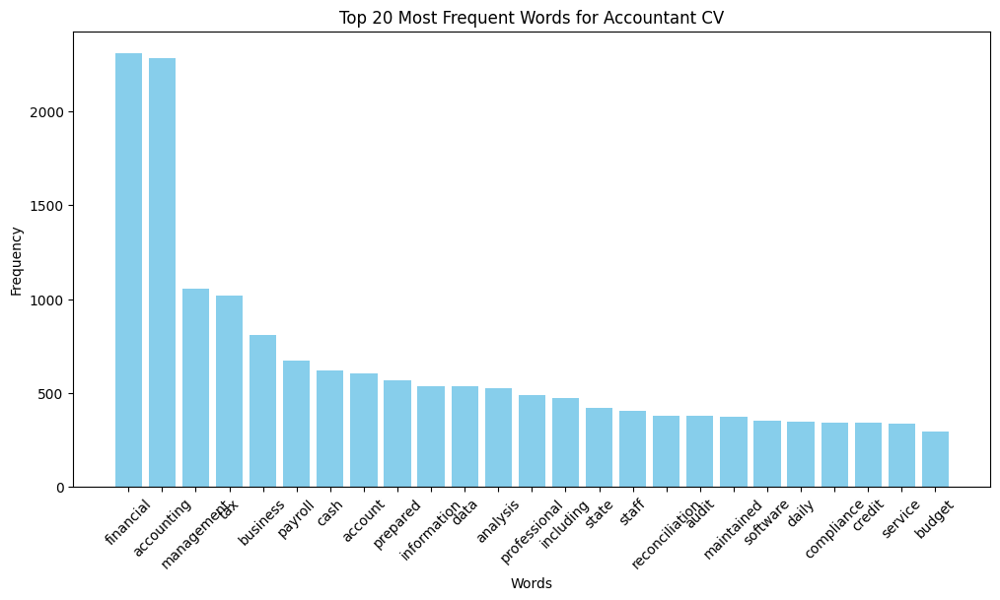

Top words for Advocate
['service', 'advocate', 'management', 'information', 'patient', 'state', 'legal', 'care', 'community', 'health', 'maintained', 'professional', 'staff', 'provided', 'communication', 'city', 'data', 'program', 'business', 'including', 'medical', 'current', 'development', 'daily', 'safety']
[928, 610, 594, 534, 386, 382, 367, 361, 359, 358, 357, 352, 342, 306, 303, 303, 295, 278, 268, 248, 243, 239, 236, 230, 211]


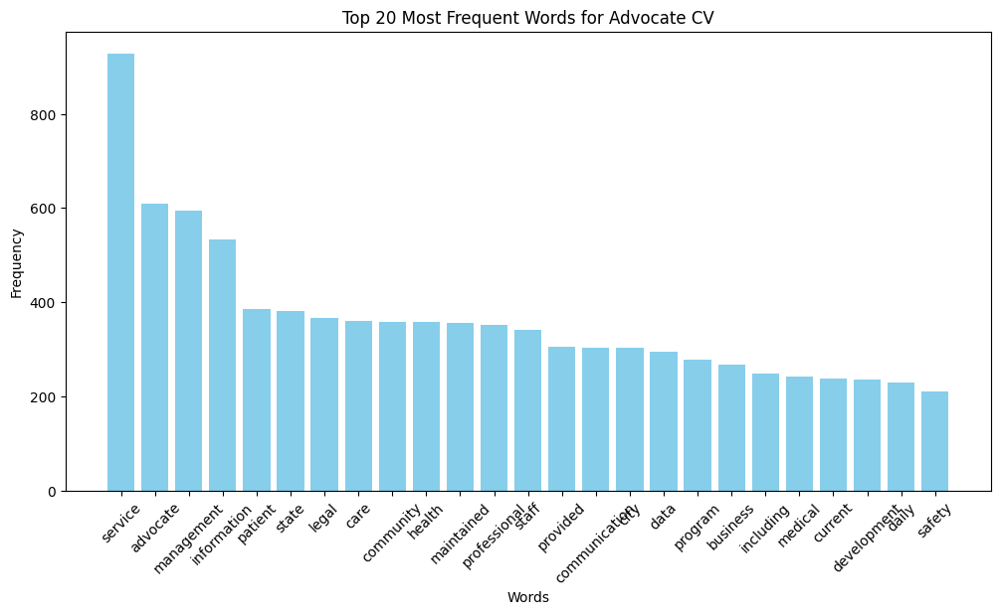

Top words for Agriculture
['equipment', 'agricultural', 'management', 'state', 'farm', 'service', 'agriculture', 'city', 'maintained', 'safety', 'maintenance', 'professional', 'development', 'production', 'crop', 'business', 'including', 'science', 'research', 'food', 'data', 'information', 'daily', 'plant', 'communication']
[929, 715, 611, 492, 468, 403, 400, 370, 367, 349, 321, 310, 271, 267, 266, 256, 245, 241, 231, 217, 214, 211, 198, 198, 196]


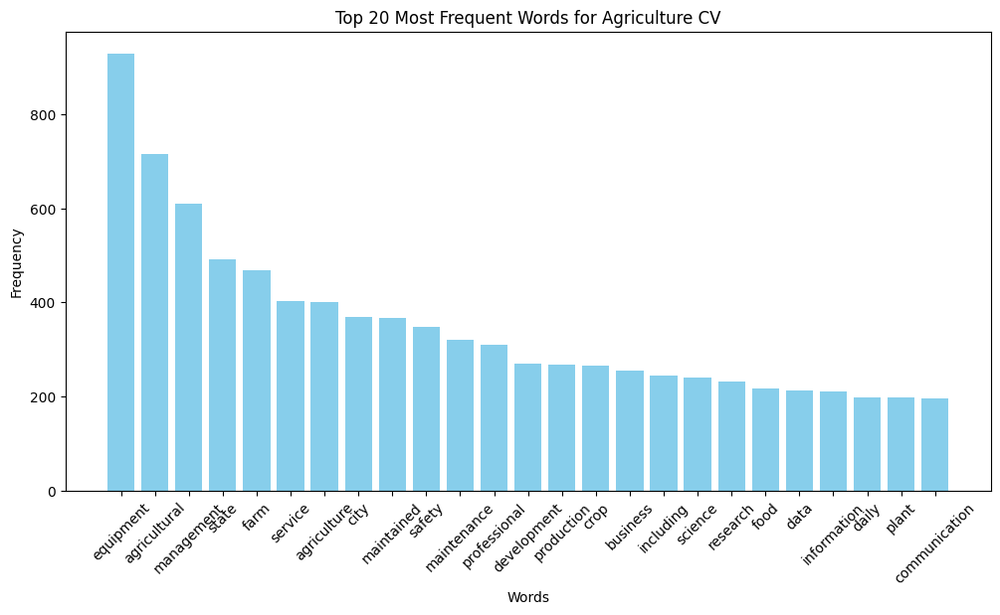

Top words for Apparel
['service', 'store', 'merchandise', 'apparel', 'management', 'design', 'cash', 'organized', 'maintained', 'floor', 'business', 'inventory', 'state', 'merchandising', 'development', 'associate', 'fashion', 'city', 'professional', 'current', 'staff', 'daily', 'communication', 'information', 'provided']
[997, 946, 901, 822, 672, 620, 502, 492, 463, 441, 437, 429, 412, 400, 385, 382, 378, 375, 370, 334, 327, 311, 288, 276, 268]


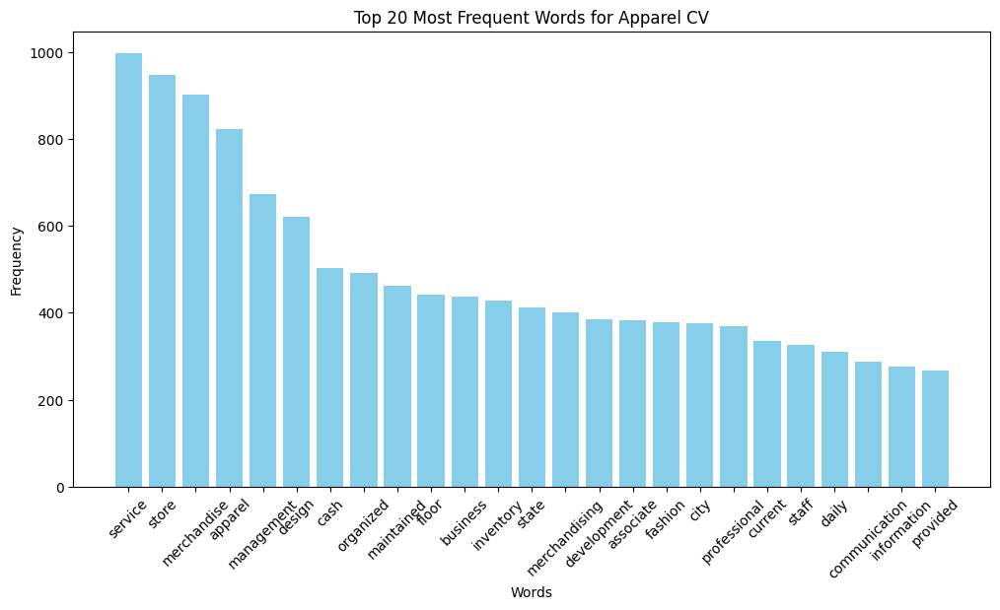

Top words for Architecture
['design', 'management', 'architecture', 'development', 'architect', 'business', 'data', 'state', 'construction', 'city', 'architectural', 'software', 'technology', 'planning', 'developed', 'professional', 'building', 'including', 'information', 'engineering', 'service', 'created', 'application', 'network', 'current']
[1694, 1139, 1031, 835, 775, 766, 744, 603, 584, 581, 487, 478, 450, 412, 407, 401, 369, 362, 352, 337, 330, 321, 307, 285, 277]


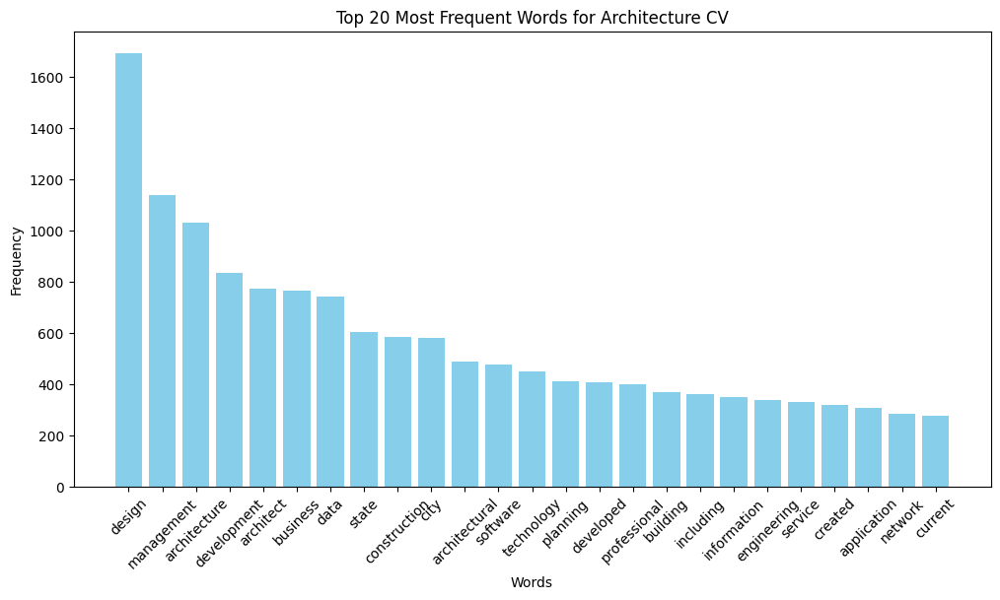

Top words for Arts
['student', 'learning', 'art', 'state', 'teacher', 'city', 'professional', 'management', 'classroom', 'teaching', 'development', 'english', 'program', 'curriculum', 'director', 'language', 'design', 'developed', 'including', 'staff', 'creative', 'lesson', 'positive', 'created', 'instruction']
[912, 893, 857, 748, 691, 584, 569, 562, 539, 507, 467, 465, 462, 454, 430, 414, 375, 370, 352, 350, 349, 343, 317, 316, 316]


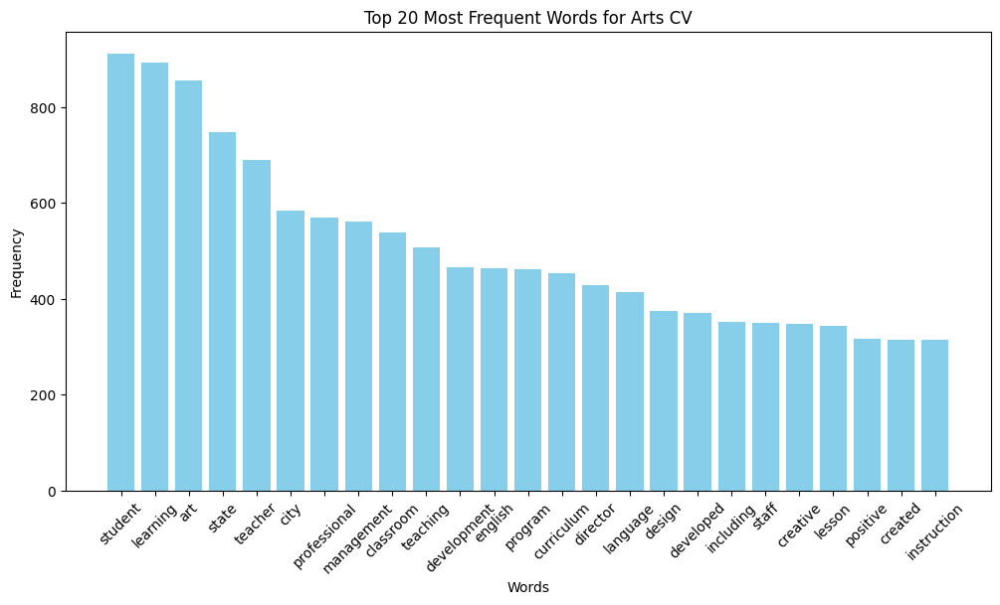

Top words for Automobile
['service', 'management', 'state', 'business', 'equipment', 'maintenance', 'automotive', 'maintained', 'repair', 'city', 'vehicle', 'professional', 'information', 'data', 'safety', 'satisfaction', 'including', 'development', 'developed', 'provided', 'current', 'inventory', 'daily', 'staff', 'communication']
[1218, 768, 592, 530, 520, 509, 500, 477, 473, 443, 427, 402, 366, 363, 330, 330, 321, 306, 284, 262, 256, 252, 229, 227, 224]


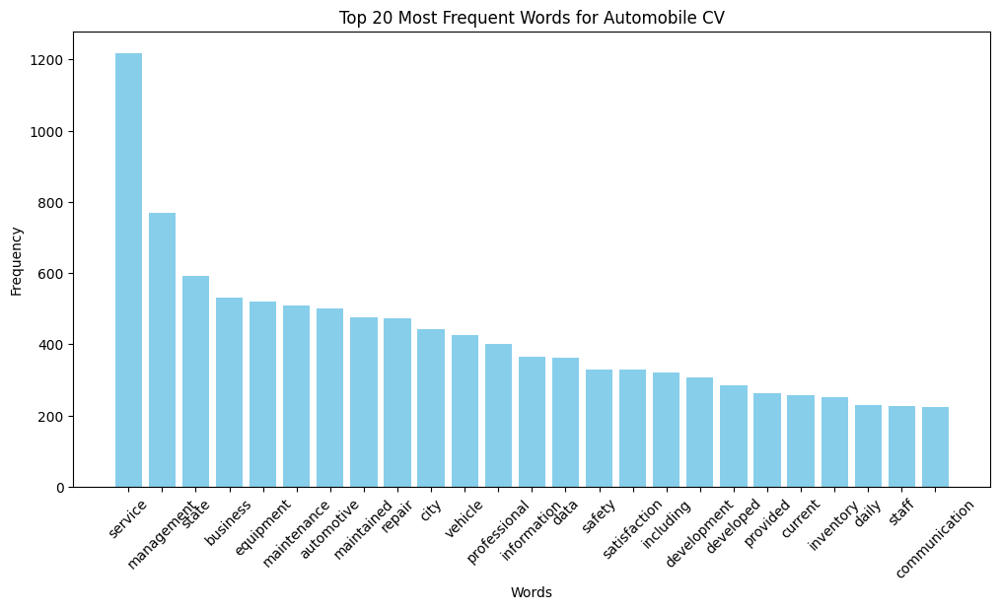

Top words for Aviation
['aircraft', 'aviation', 'maintenance', 'equipment', 'management', 'safety', 'flight', 'service', 'maintained', 'city', 'state', 'professional', 'pilot', 'personnel', 'data', 'including', 'security', 'information', 'repair', 'current', 'daily', 'communication', 'inventory', 'staff', 'development']
[1381, 1248, 1199, 920, 885, 877, 871, 614, 571, 445, 439, 390, 365, 347, 337, 332, 332, 319, 291, 287, 286, 285, 273, 257, 256]


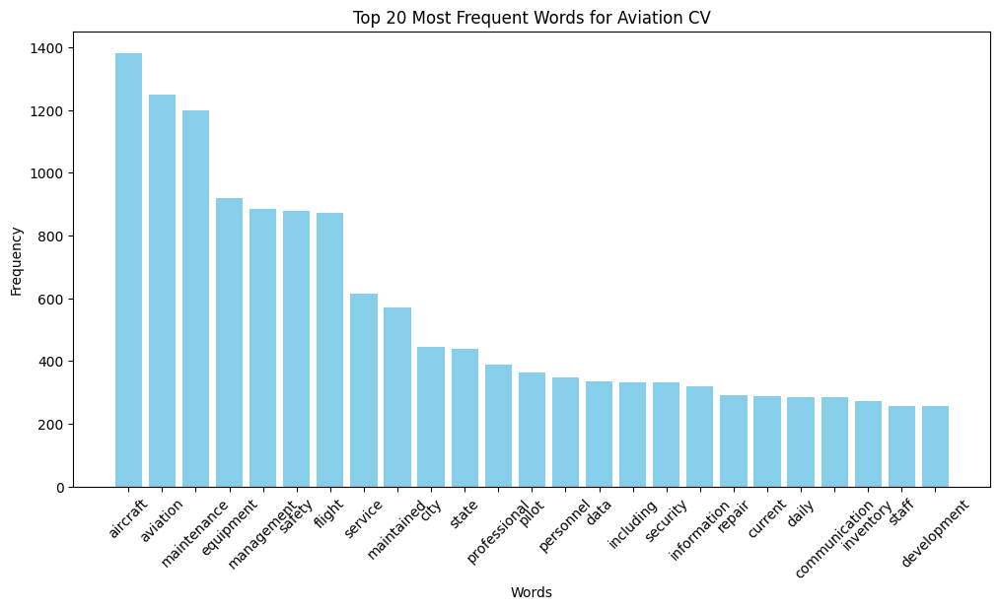

Top words for BPO
['management', 'service', 'call', 'business', 'center', 'data', 'information', 'communication', 'maintained', 'professional', 'staff', 'development', 'satisfaction', 'state', 'city', 'software', 'provided', 'developed', 'daily', 'account', 'agent', 'current', 'financial', 'leadership', 'including']
[796, 765, 549, 528, 433, 311, 307, 252, 235, 231, 223, 223, 218, 217, 215, 204, 176, 168, 166, 158, 156, 152, 151, 145, 136]


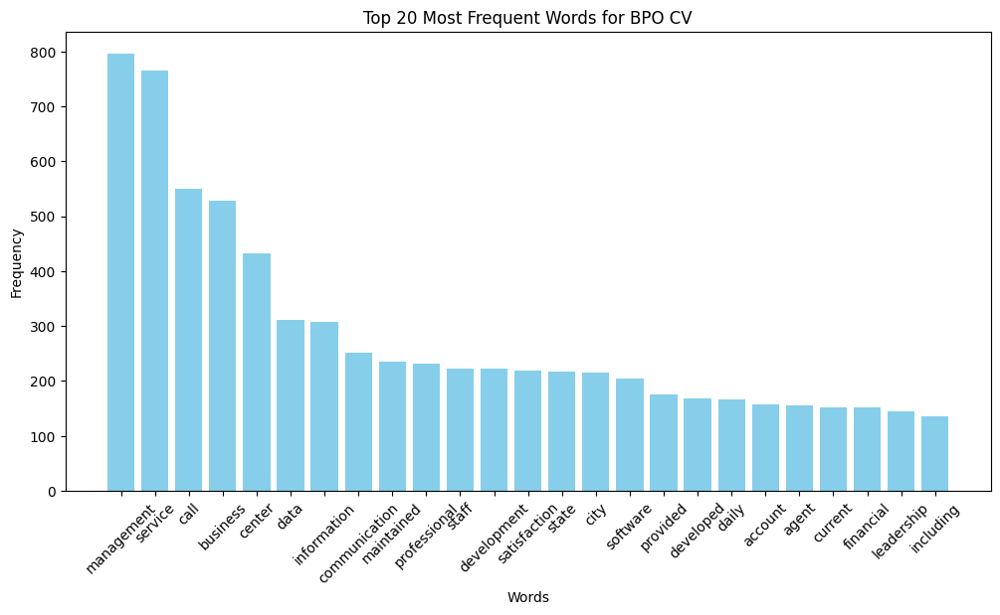

Top words for Banking
['management', 'financial', 'banking', 'business', 'service', 'state', 'staff', 'credit', 'development', 'daily', 'branch', 'cash', 'program', 'compliance', 'professional', 'loan', 'city', 'leadership', 'data', 'current', 'including', 'maintained', 'information', 'analysis', 'developed']
[1381, 1202, 1176, 1170, 910, 557, 550, 530, 511, 469, 460, 449, 440, 423, 417, 397, 393, 375, 344, 344, 324, 316, 316, 305, 295]


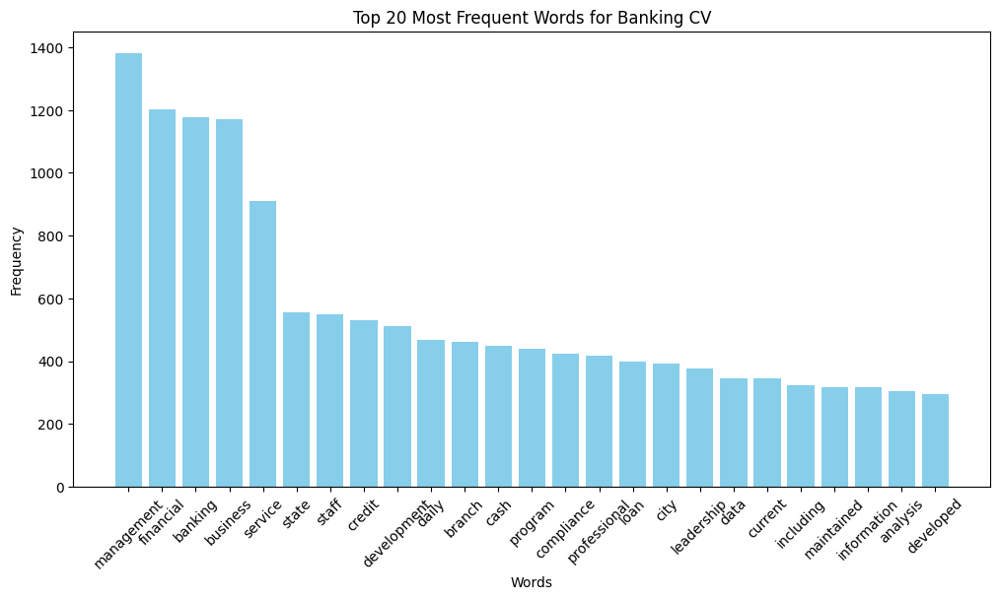

Top words for Blockchain
['blockchain', 'development', 'developer', 'business', 'management', 'faculty', 'data', 'technology', 'software', 'developed', 'research', 'information', 'smart', 'state', 'web', 'york', 'security', 'financial', 'department', 'community', 'program', 'city', 'science', 'including', 'analysis']
[318, 180, 149, 148, 131, 118, 106, 101, 98, 97, 81, 76, 70, 70, 69, 66, 65, 59, 56, 54, 54, 53, 51, 48, 46]


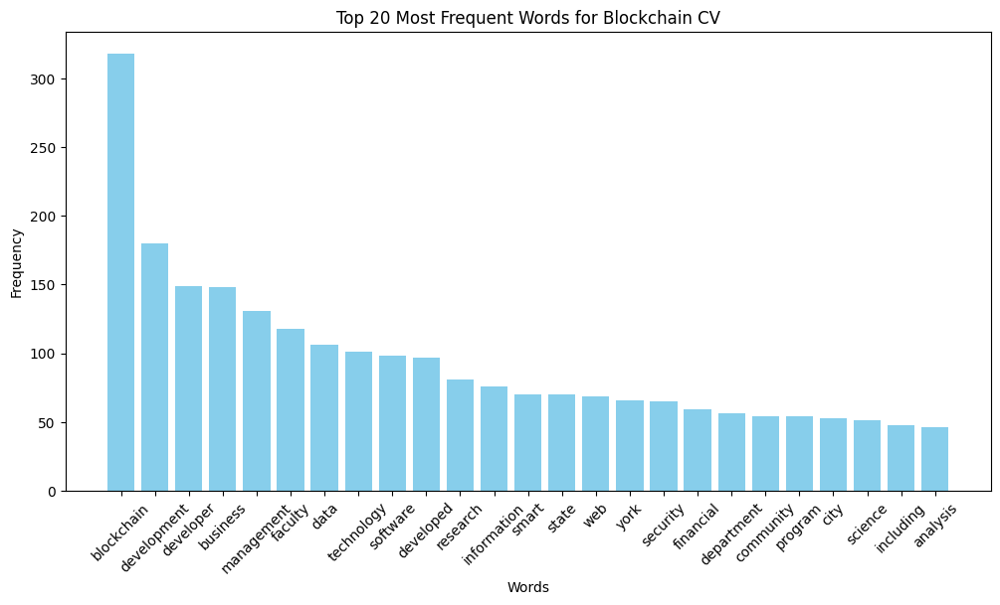

Top words for Building and Construction
['construction', 'equipment', 'building', 'safety', 'management', 'maintenance', 'site', 'state', 'maintained', 'city', 'including', 'daily', 'professional', 'service', 'compliance', 'communication', 'electrical', 'repair', 'budget', 'design', 'business', 'staff', 'schedule', 'inventory', 'planning']
[2673, 1233, 1206, 1136, 917, 692, 677, 524, 514, 492, 366, 365, 359, 330, 329, 294, 285, 280, 277, 274, 261, 255, 249, 246, 243]


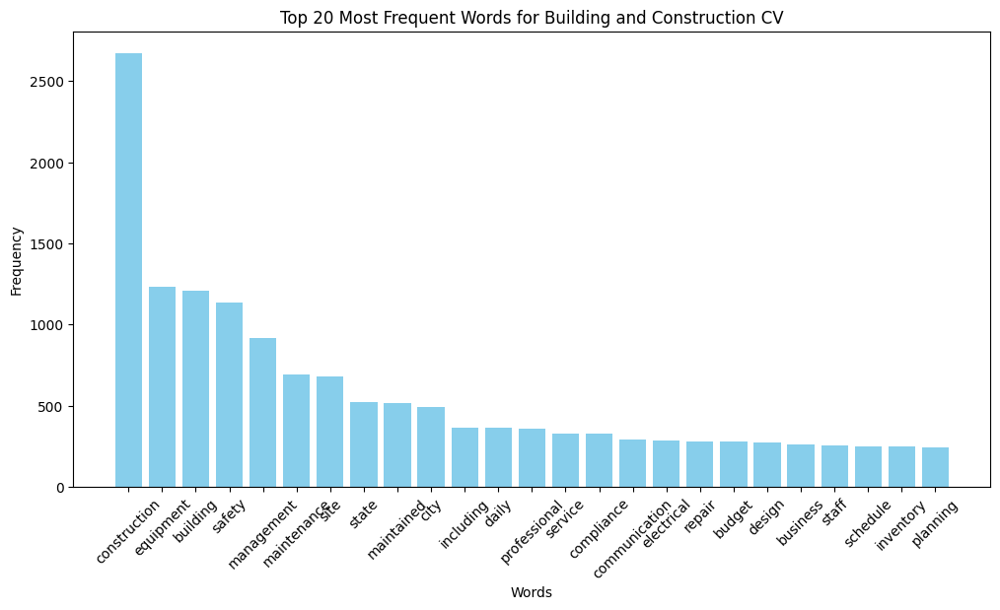

Top words for Business Analyst
['business', 'data', 'management', 'analysis', 'analyst', 'development', 'testing', 'test', 'software', 'financial', 'developed', 'information', 'application', 'use', 'design', 'sql', 'agile', 'created', 'planning', 'including', 'professional', 'service', 'current', 'state', 'microsoft']
[4380, 1802, 1559, 1353, 1144, 937, 797, 667, 573, 485, 468, 452, 444, 425, 419, 411, 389, 388, 387, 340, 337, 336, 318, 307, 302]


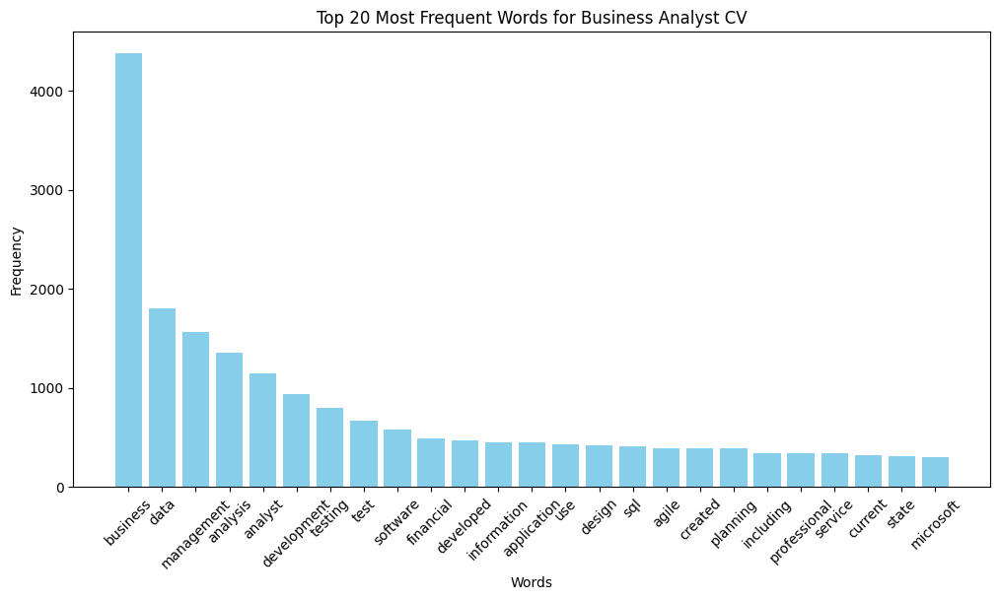

Top words for Civil Engineer
['civil', 'engineering', 'construction', 'design', 'engineer', 'management', 'state', 'site', 'city', 'professional', 'safety', 'data', 'water', 'equipment', 'development', 'including', 'cost', 'analysis', 'planning', 'compliance', 'building', 'service', 'science', 'information', 'public']
[1881, 1537, 1216, 1166, 1028, 852, 572, 565, 488, 437, 407, 375, 374, 357, 332, 305, 305, 290, 282, 277, 271, 270, 255, 255, 246]


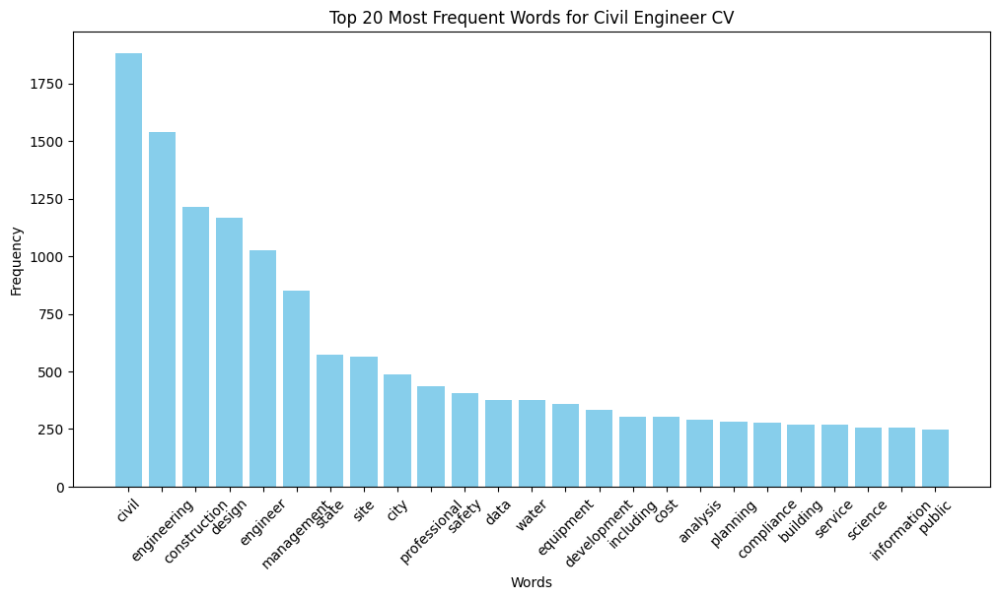

Top words for Consultant
['management', 'business', 'consultant', 'development', 'data', 'analysis', 'service', 'marketing', 'developed', 'financial', 'state', 'professional', 'city', 'staff', 'including', 'planning', 'current', 'provided', 'communication', 'information', 'program', 'software', 'leadership', 'design', 'created']
[1794, 1711, 892, 849, 664, 544, 542, 521, 515, 482, 433, 418, 398, 394, 393, 356, 327, 322, 316, 313, 301, 300, 296, 286, 282]


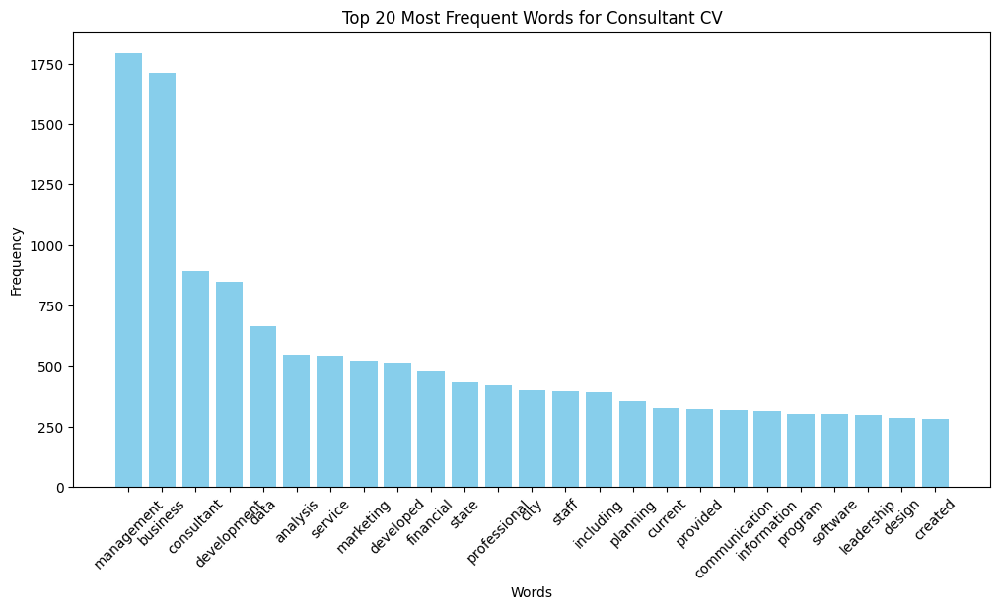

Top words for Data Science
['data', 'science', 'learning', 'student', 'management', 'development', 'state', 'business', 'city', 'classroom', 'teacher', 'analysis', 'research', 'professional', 'developed', 'machine', 'teaching', 'instruction', 'program', 'curriculum', 'python', 'current', 'scientist', 'technology', 'leadership']
[2485, 1503, 1096, 704, 585, 578, 569, 528, 463, 460, 456, 454, 428, 405, 351, 337, 336, 336, 322, 302, 294, 294, 292, 273, 266]


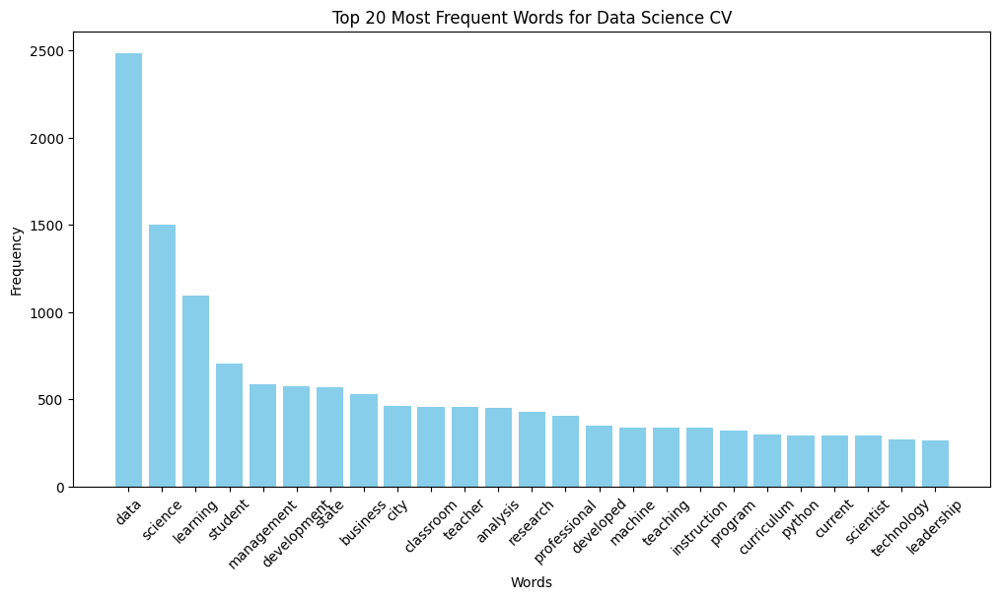

Top words for Database
['database', 'data', 'sql', 'server', 'oracle', 'management', 'development', 'recovery', 'business', 'security', 'software', 'tuning', 'production', 'administrator', 'design', 'monitoring', 'microsoft', 'information', 'application', 'maintenance', 'implemented', 'created', 'science', 'testing', 'analysis']
[3386, 2058, 1730, 1316, 933, 805, 582, 497, 496, 488, 448, 444, 432, 424, 391, 378, 357, 355, 340, 334, 333, 319, 318, 304, 291]


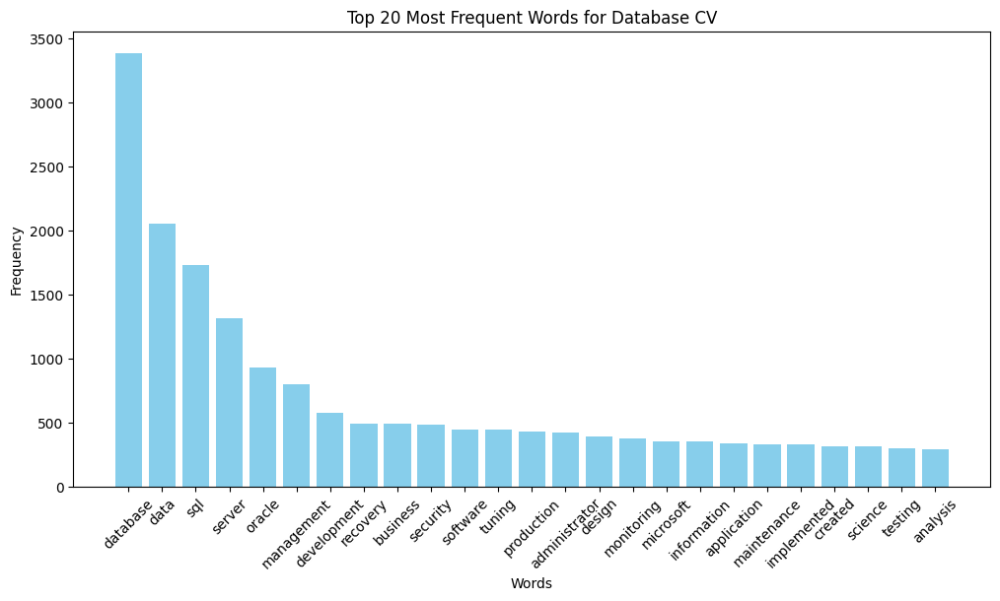

Top words for Designing
['design', 'designer', 'graphic', 'management', 'creative', 'state', 'development', 'developed', 'service', 'created', 'city', 'business', 'marketing', 'professional', 'maintained', 'adobe', 'information', 'current', 'including', 'designed', 'interior', 'production', 'digital', 'communication', 'equipment']
[1676, 796, 456, 355, 350, 350, 323, 320, 320, 308, 305, 303, 279, 265, 264, 243, 237, 233, 230, 230, 221, 219, 207, 201, 187]


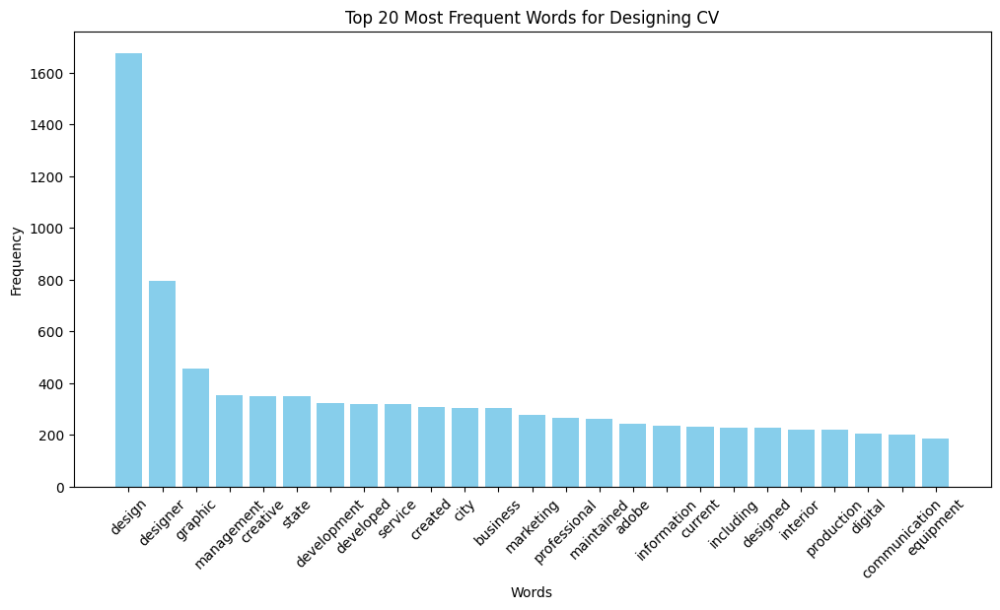

Top words for DevOps
['aws', 'devops', 'cloud', 'management', 'engineer', 'jenkins', 'deployment', 'docker', 'software', 'development', 'application', 'infrastructure', 'code', 'continuous', 'linux', 'azure', 'server', 'data', 'git', 'automation', 'configuration', 'web', 'created', 'monitoring', 'security']
[1407, 1344, 1123, 971, 969, 900, 851, 825, 728, 728, 710, 699, 685, 609, 608, 601, 544, 523, 516, 502, 478, 471, 466, 450, 436]


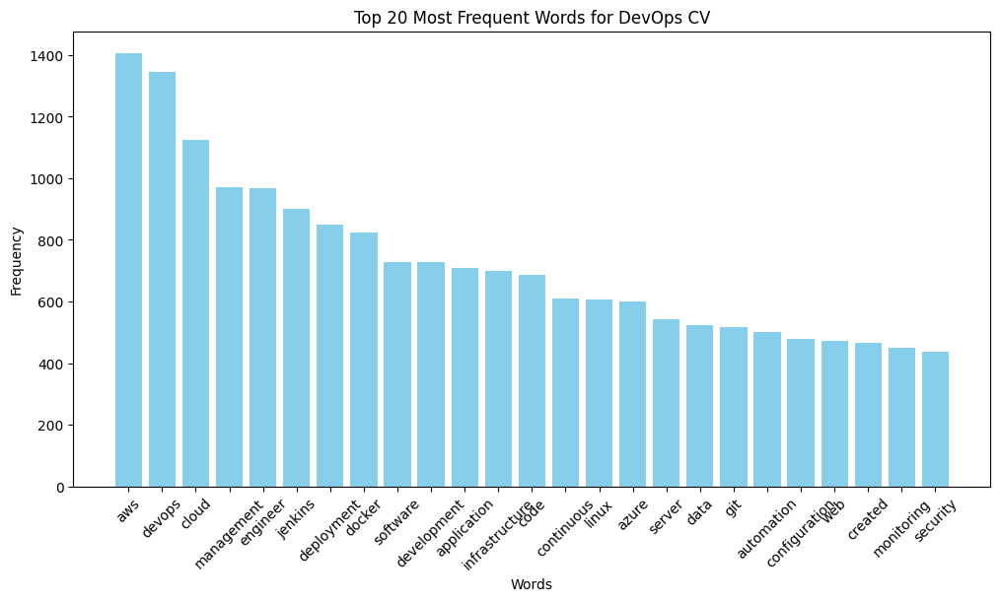

Top words for Digital Media
['marketing', 'digital', 'social', 'management', 'content', 'business', 'development', 'design', 'state', 'including', 'creative', 'website', 'brand', 'professional', 'google', 'developed', 'production', 'city', 'strategy', 'data', 'service', 'web', 'created', 'current', 'communication']
[2349, 1716, 1298, 1054, 1040, 710, 594, 550, 467, 463, 462, 438, 434, 429, 429, 415, 407, 388, 385, 371, 357, 354, 340, 338, 323]


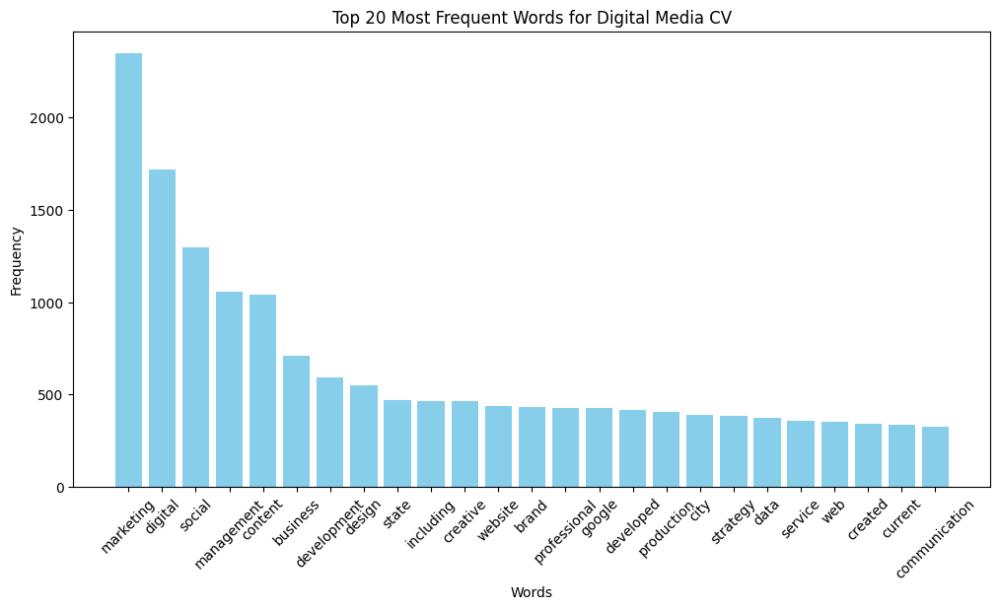

Top words for DotNet Developer
['web', 'net', 'data', 'development', 'sql', 'server', 'application', 'aspnet', 'developed', 'design', 'c', 'software', 'developer', 'framework', 'database', 'business', 'html', 'testing', 'management', 'javascript', 'code', 'jquery', 'created', 'microsoft', 'implemented']
[2563, 2091, 2068, 1856, 1720, 1607, 1601, 1517, 1388, 1299, 1299, 1290, 1182, 1016, 925, 858, 852, 792, 770, 760, 727, 701, 697, 618, 576]


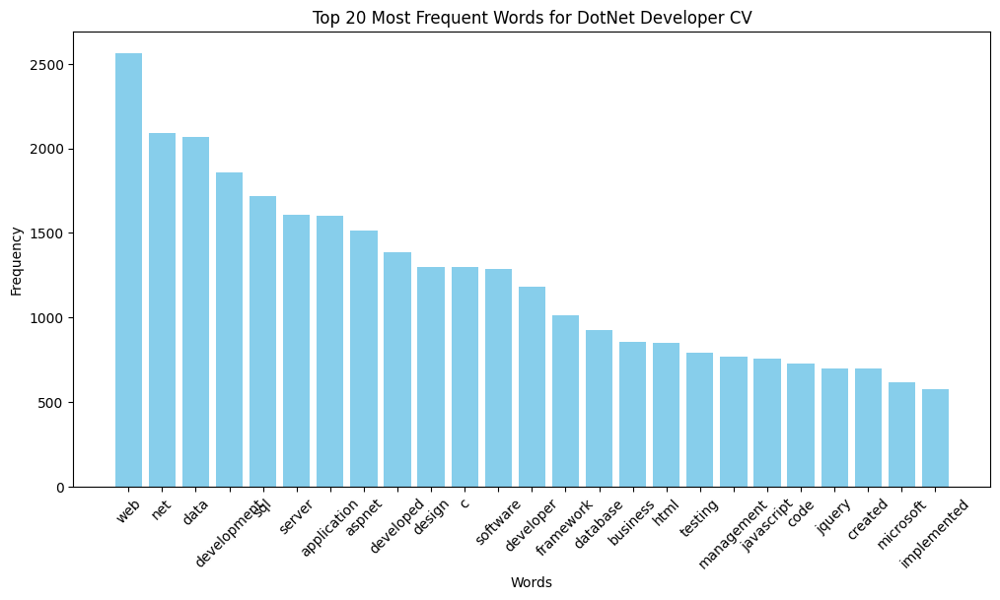

Top words for ETL Developer
['data', 'sql', 'etl', 'business', 'informatica', 'server', 'development', 'database', 'design', 'testing', 'developer', 'test', 'oracle', 'created', 'developed', 'analysis', 'warehouse', 'management', 'source', 'ssis', 'integration', 'application', 'designed', 'production', 'stored']
[7091, 2289, 2120, 1975, 1275, 1268, 1196, 1159, 1140, 1130, 990, 979, 929, 904, 901, 804, 802, 750, 678, 651, 607, 526, 470, 447, 439]


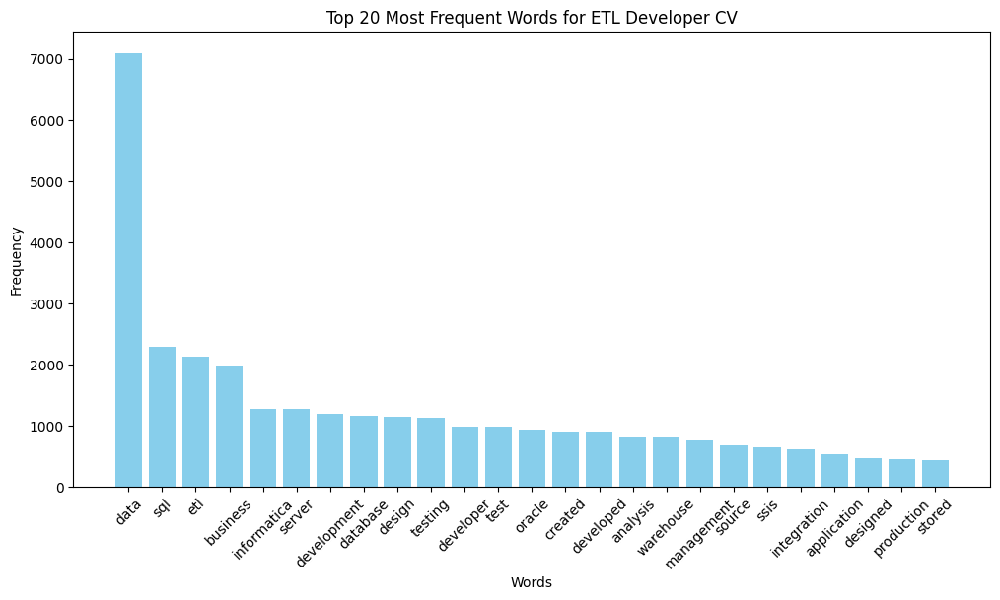

Top words for Education
['student', 'learning', 'teacher', 'classroom', 'management', 'teaching', 'state', 'development', 'educational', 'positive', 'professional', 'instruction', 'program', 'curriculum', 'staff', 'lesson', 'city', 'social', 'developed', 'maintained', 'behavior', 'implemented', 'communication', 'science', 'provided']
[1672, 1435, 1423, 1280, 828, 771, 748, 741, 632, 578, 577, 562, 551, 541, 534, 527, 484, 425, 423, 421, 416, 380, 357, 346, 331]


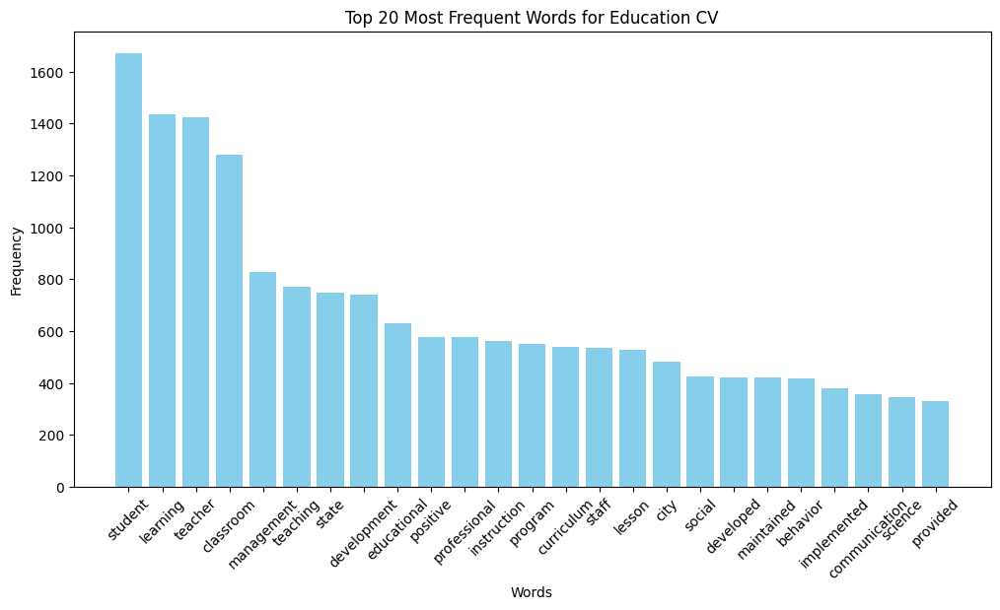

Top words for Electrical Engineering
['electrical', 'equipment', 'engineering', 'design', 'safety', 'maintenance', 'engineer', 'wiring', 'management', 'state', 'repair', 'testing', 'installed', 'service', 'construction', 'maintained', 'city', 'development', 'including', 'troubleshooting', 'circuit', 'professional', 'production', 'test', 'communication']
[4211, 1837, 995, 930, 907, 848, 707, 662, 605, 516, 500, 488, 451, 406, 381, 372, 366, 356, 347, 345, 342, 336, 308, 303, 292]


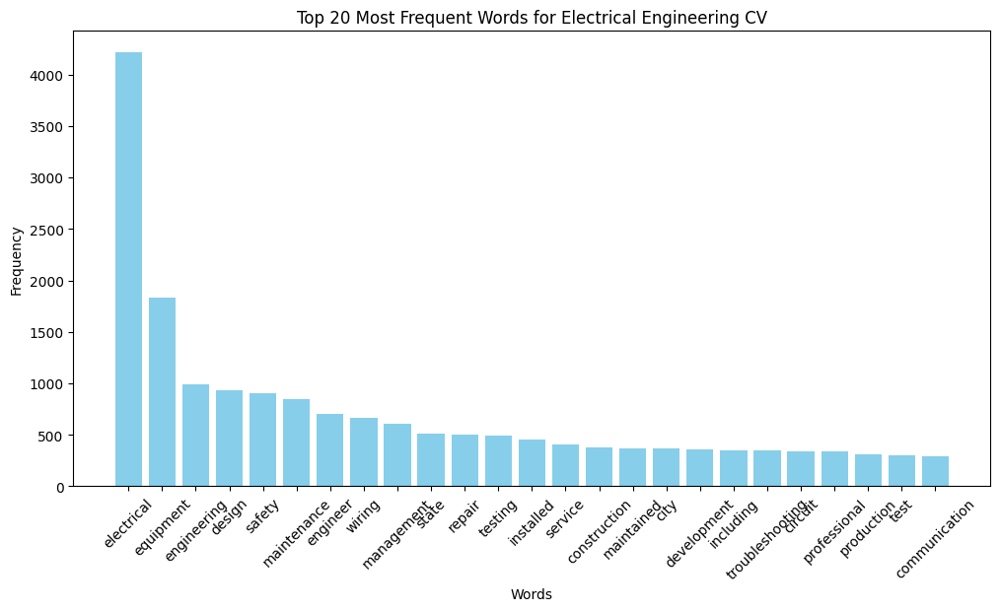

Top words for Finance
['financial', 'management', 'finance', 'business', 'accounting', 'analysis', 'data', 'state', 'service', 'including', 'information', 'budget', 'staff', 'professional', 'city', 'cash', 'development', 'planning', 'revenue', 'prepared', 'developed', 'payroll', 'maintained', 'current', 'compliance']
[2620, 1488, 1287, 1150, 1017, 790, 576, 559, 494, 461, 456, 441, 438, 432, 407, 405, 399, 386, 375, 369, 366, 362, 358, 356, 340]


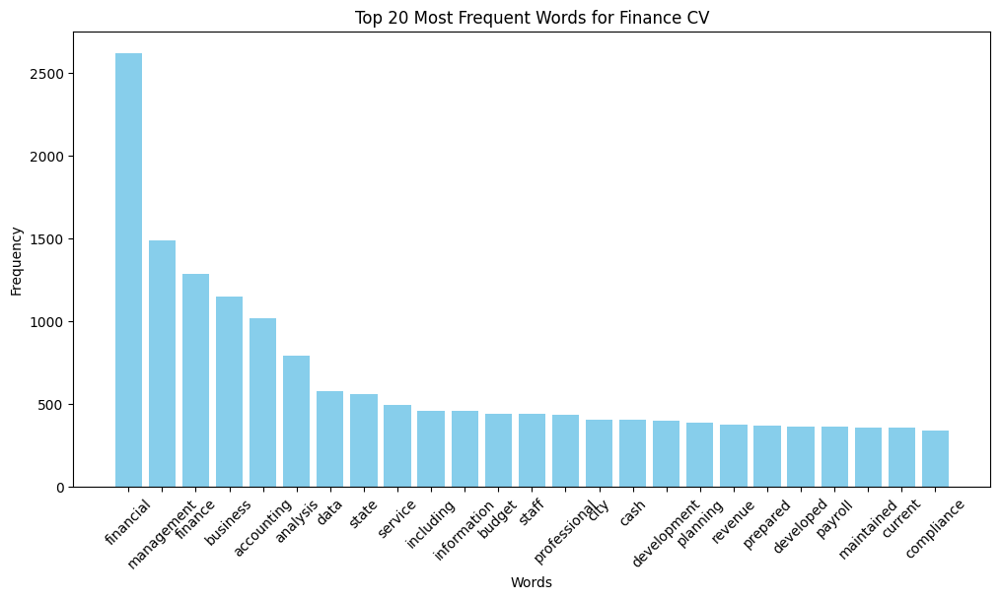

Top words for Food and Beverages
['food', 'beverage', 'service', 'management', 'staff', 'restaurant', 'inventory', 'guest', 'menu', 'daily', 'safety', 'professional', 'including', 'satisfaction', 'hotel', 'business', 'development', 'marketing', 'director', 'maintained', 'communication', 'planning', 'city', 'revenue', 'leadership']
[1120, 635, 565, 352, 281, 229, 196, 168, 157, 156, 125, 124, 123, 121, 120, 119, 106, 100, 96, 95, 94, 92, 89, 87, 85]


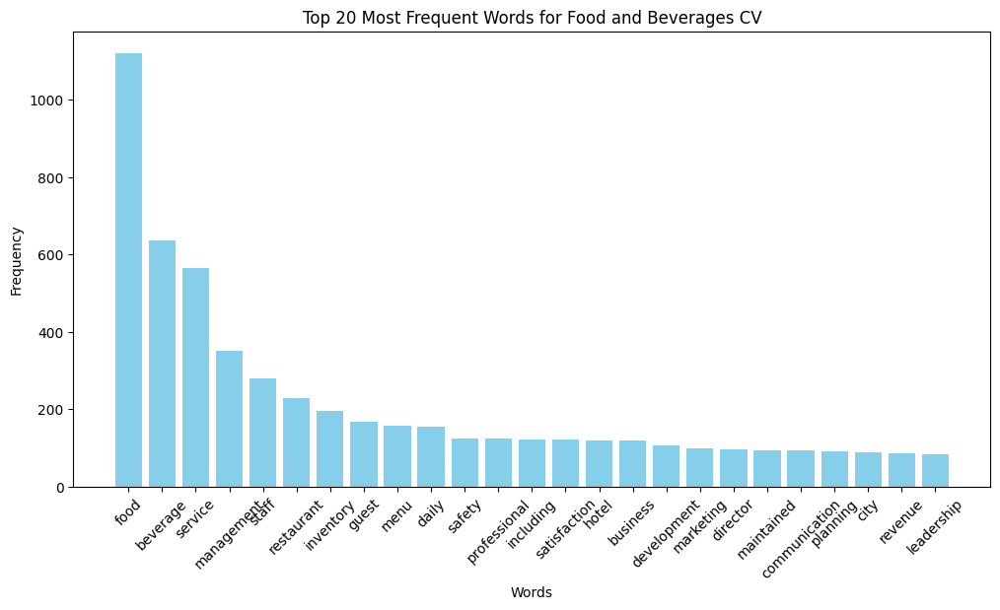

Top words for Health and Fitness
['fitness', 'health', 'exercise', 'personal', 'group', 'management', 'wellness', 'program', 'state', 'equipment', 'professional', 'city', 'service', 'nutrition', 'certified', 'current', 'trainer', 'safety', 'care', 'staff', 'development', 'business', 'maintained', 'including', 'developed']
[2833, 1841, 974, 865, 797, 710, 632, 625, 624, 561, 552, 546, 489, 473, 454, 442, 436, 406, 389, 384, 369, 364, 353, 344, 337]


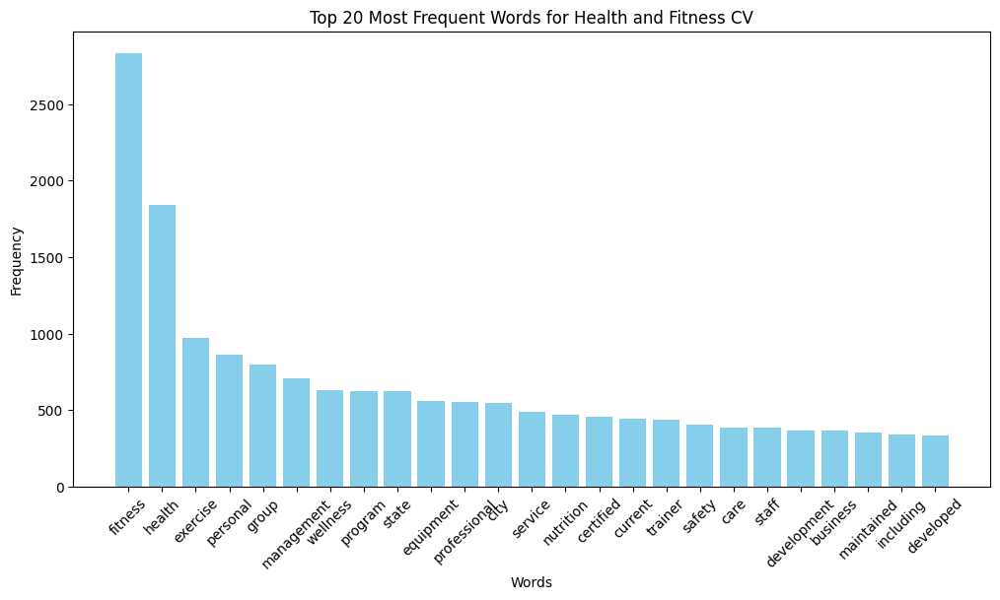

Top words for Human Resources
['management', 'employee', 'human', 'hr', 'development', 'business', 'payroll', 'staff', 'professional', 'recruitment', 'compensation', 'including', 'information', 'state', 'maintained', 'compliance', 'personnel', 'data', 'leadership', 'service', 'department', 'developed', 'program', 'resource', 'planning']
[2035, 1988, 1751, 1604, 851, 786, 662, 644, 617, 600, 583, 558, 556, 525, 525, 502, 498, 493, 446, 415, 408, 401, 398, 346, 332]


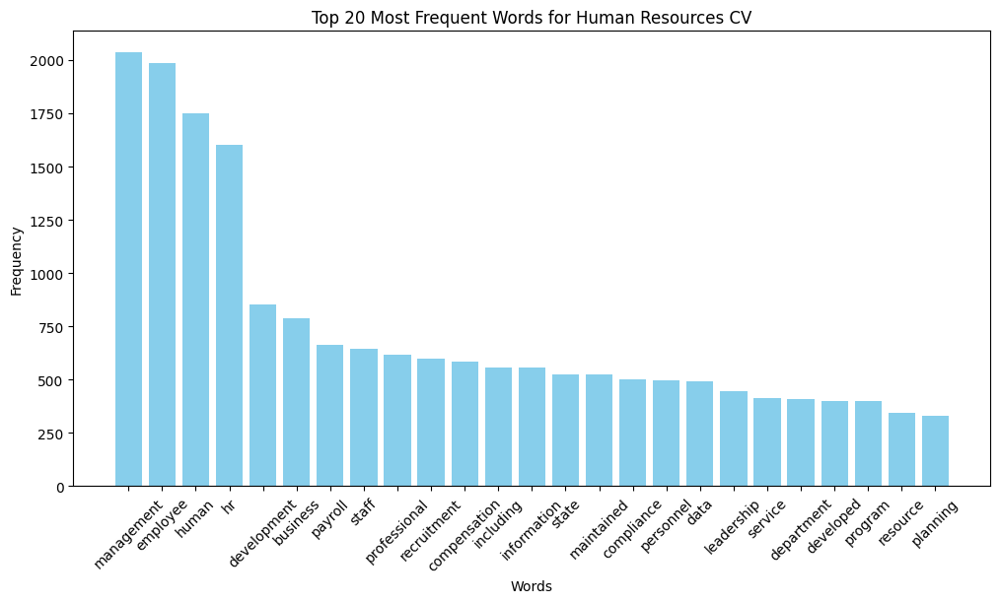

Top words for Information Technology
['technology', 'management', 'information', 'software', 'network', 'security', 'business', 'data', 'hardware', 'development', 'computer', 'service', 'infrastructure', 'professional', 'server', 'staff', 'including', 'microsoft', 'maintained', 'state', 'troubleshooting', 'current', 'implementation', 'city', 'developed']
[1194, 1161, 1160, 934, 883, 828, 697, 606, 551, 545, 474, 438, 347, 345, 334, 325, 311, 310, 305, 292, 285, 268, 266, 260, 256]


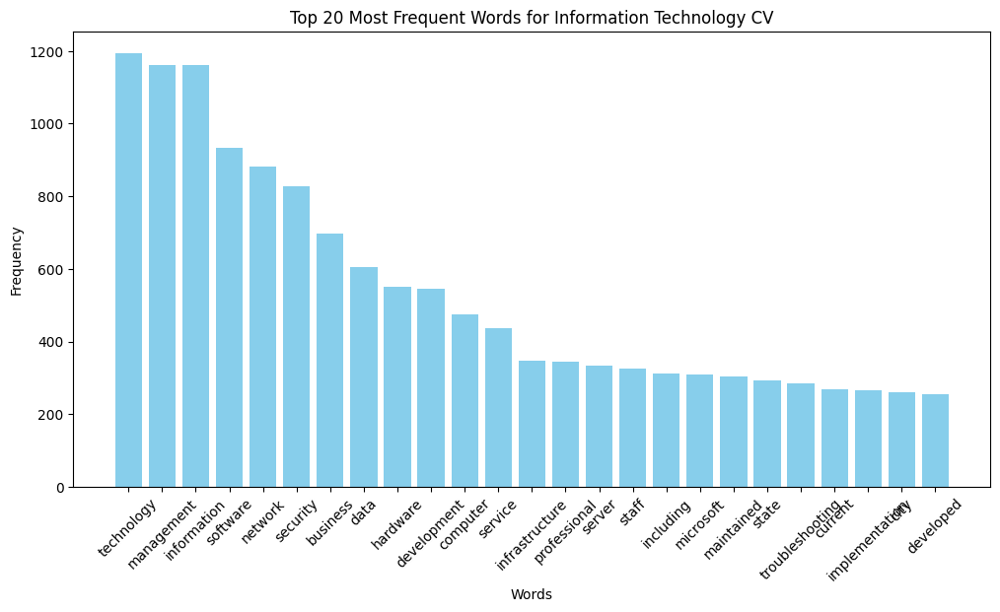

Top words for Java Developer
['spring', 'java', 'web', 'application', 'development', 'developed', 'design', 'data', 'developer', 'software', 'testing', 'html', 'framework', 'sql', 'code', 'business', 'javascript', 'implemented', 'database', 'server', 'oracle', 'test', 'management', 'agile', 'designed']
[3155, 3126, 2278, 2100, 1984, 1556, 1502, 1472, 1357, 1264, 1072, 909, 904, 899, 876, 873, 860, 859, 853, 816, 728, 664, 611, 607, 526]


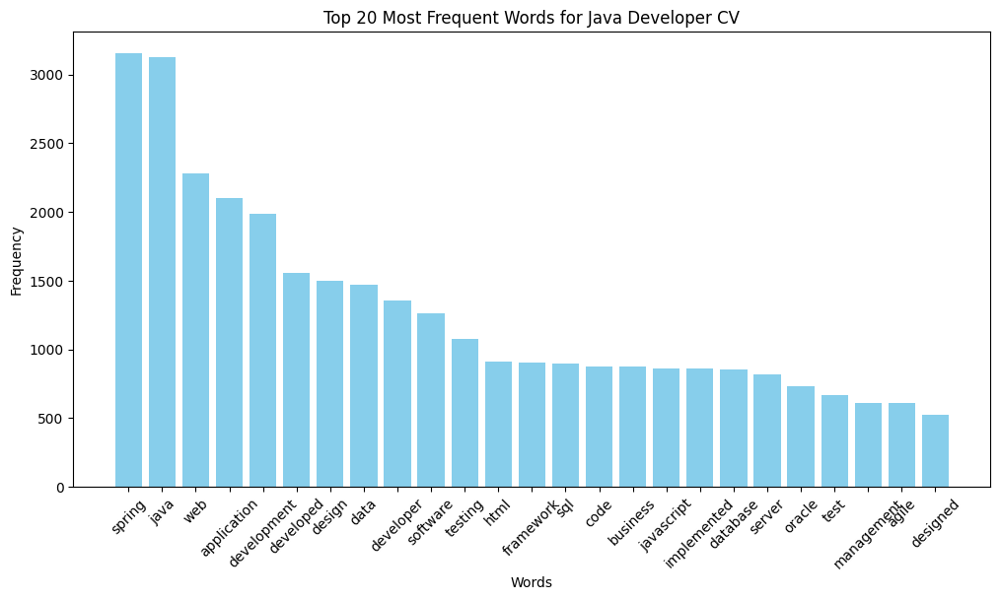

Top words for Management
['management', 'business', 'service', 'development', 'data', 'professional', 'information', 'staff', 'state', 'including', 'city', 'program', 'financial', 'maintained', 'developed', 'planning', 'communication', 'compliance', 'current', 'leadership', 'safety', 'provided', 'daily', 'analysis', 'inventory']
[2481, 968, 662, 611, 590, 508, 481, 478, 477, 448, 404, 383, 378, 361, 351, 348, 345, 335, 334, 322, 317, 315, 302, 290, 289]


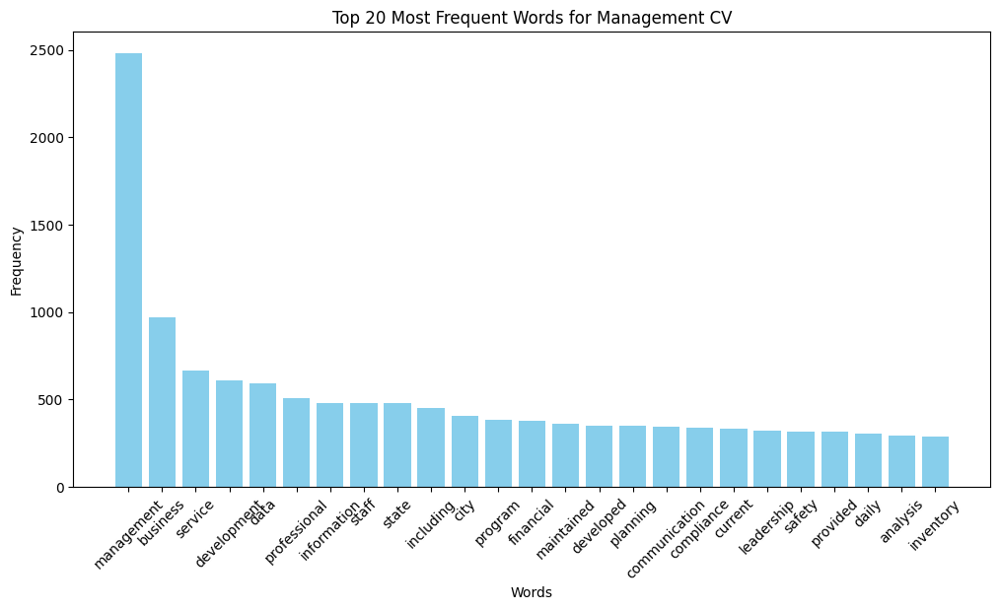

Top words for Mechanical Engineer
['mechanical', 'design', 'engineering', 'engineer', 'equipment', 'manufacturing', 'analysis', 'development', 'management', 'maintenance', 'production', 'testing', 'solidworks', 'designed', 'state', 'developed', 'test', 'software', 'professional', 'machine', 'science', 'including', 'city', 'safety', 'cost']
[2468, 2382, 1784, 1379, 1054, 673, 666, 666, 622, 565, 563, 489, 389, 387, 380, 367, 362, 343, 339, 336, 323, 290, 273, 271, 268]


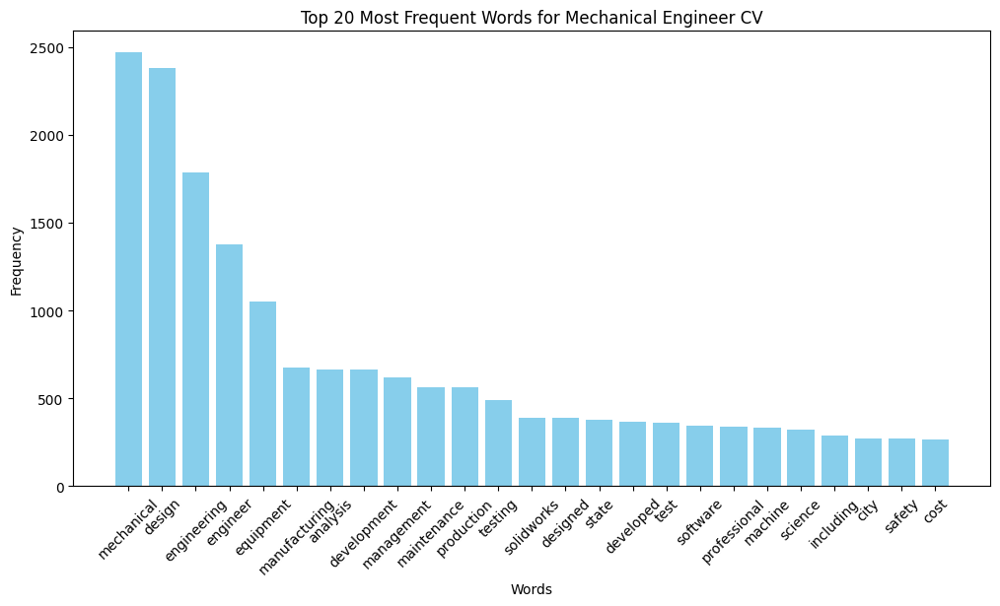

Top words for Network Security Engineer
['network', 'security', 'cisco', 'management', 'engineer', 'data', 'software', 'troubleshooting', 'access', 'hardware', 'infrastructure', 'firewall', 'design', 'information', 'configuration', 'server', 'including', 'routing', 'implemented', 'service', 'equipment', 'maintenance', 'engineering', 'monitoring', 'implementation']
[4807, 2875, 1798, 1125, 1022, 771, 748, 726, 629, 618, 601, 575, 549, 521, 506, 501, 479, 478, 456, 456, 452, 436, 424, 421, 395]


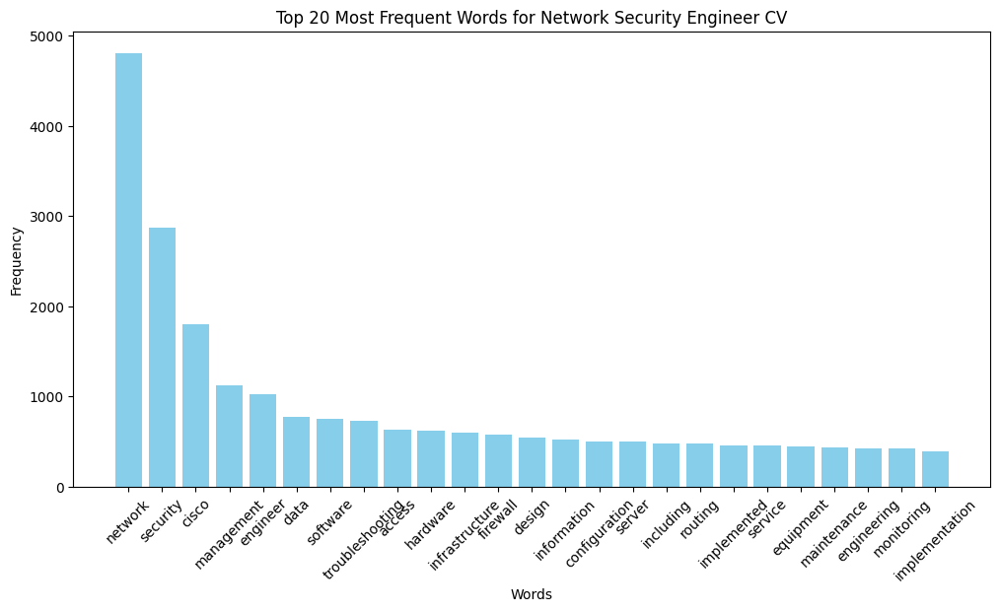

Top words for Operations Manager
['management', 'business', 'service', 'staff', 'development', 'inventory', 'daily', 'safety', 'operational', 'employee', 'developed', 'leadership', 'professional', 'maintained', 'equipment', 'production', 'planning', 'including', 'financial', 'current', 'compliance', 'implemented', 'state', 'communication', 'data']
[1791, 1131, 871, 766, 564, 543, 477, 474, 473, 456, 437, 423, 412, 408, 396, 393, 377, 377, 348, 330, 329, 320, 294, 294, 284]


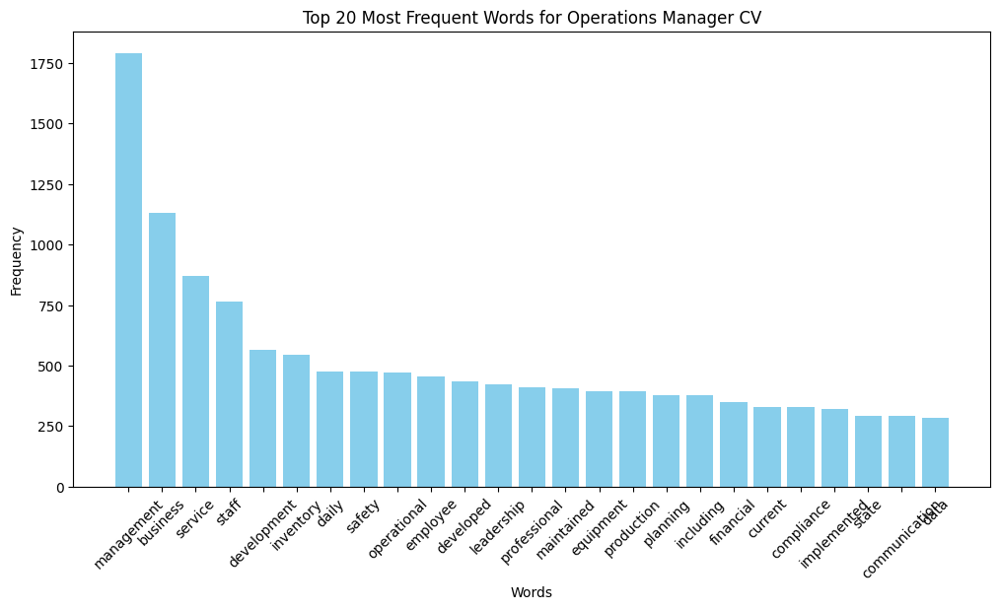

Top words for PMO
['management', 'business', 'development', 'pmo', 'program', 'state', 'data', 'planning', 'city', 'developed', 'professional', 'leadership', 'financial', 'agile', 'including', 'budget', 'software', 'information', 'analysis', 'change', 'service', 'improvement', 'testing', 'risk', 'implementation']
[3120, 1560, 889, 873, 831, 590, 561, 551, 516, 464, 462, 458, 432, 430, 416, 411, 401, 397, 391, 387, 384, 379, 367, 354, 351]


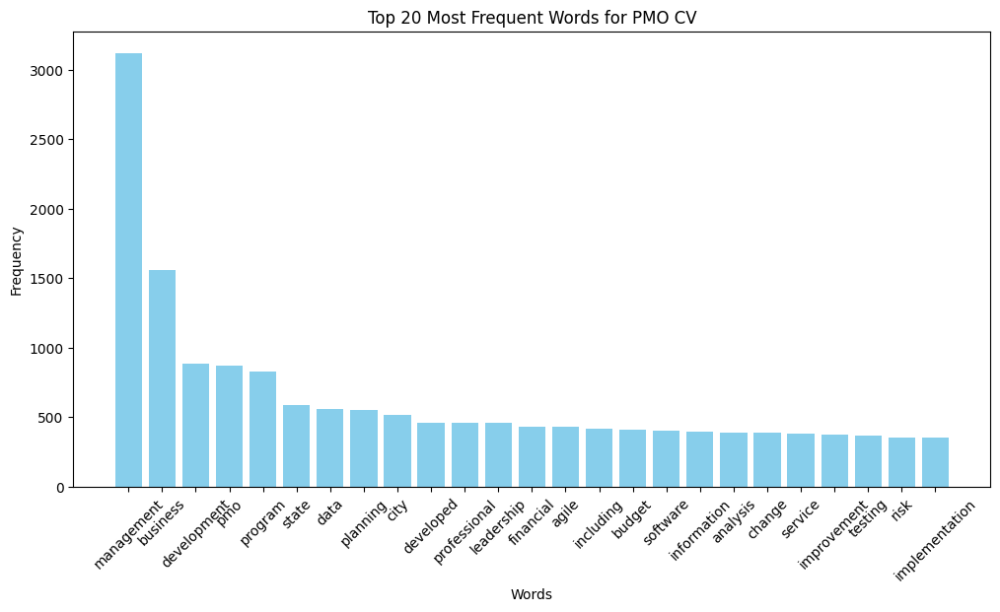

Top words for Public Relations
['public', 'marketing', 'management', 'social', 'press', 'state', 'including', 'communication', 'pr', 'business', 'content', 'city', 'community', 'staff', 'service', 'development', 'developed', 'professional', 'brand', 'information', 'event', 'planning', 'leadership', 'maintained', 'program']
[1954, 1245, 988, 832, 778, 637, 596, 559, 536, 522, 514, 510, 479, 469, 455, 450, 443, 413, 408, 395, 392, 334, 327, 321, 319]


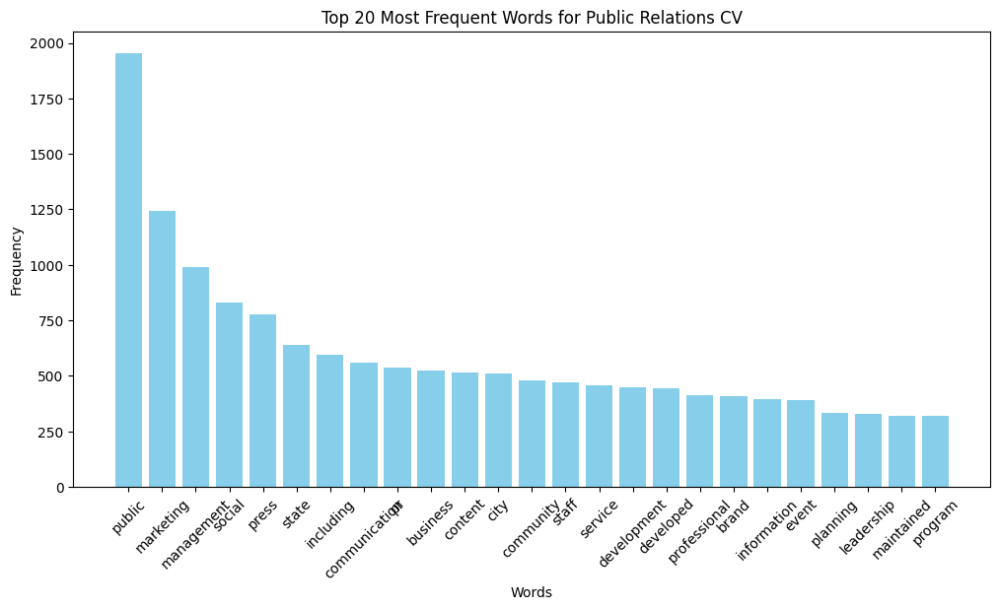

Top words for Python Developer
['data', 'python', 'developed', 'development', 'web', 'sql', 'developer', 'application', 'software', 'database', 'business', 'aws', 'design', 'code', 'created', 'implemented', 'testing', 'server', 'management', 'django', 'analysis', 'javascript', 'cloud', 'java', 'designed']
[2909, 1783, 961, 907, 901, 843, 841, 732, 622, 594, 548, 544, 538, 507, 488, 479, 468, 464, 460, 458, 407, 397, 390, 388, 387]


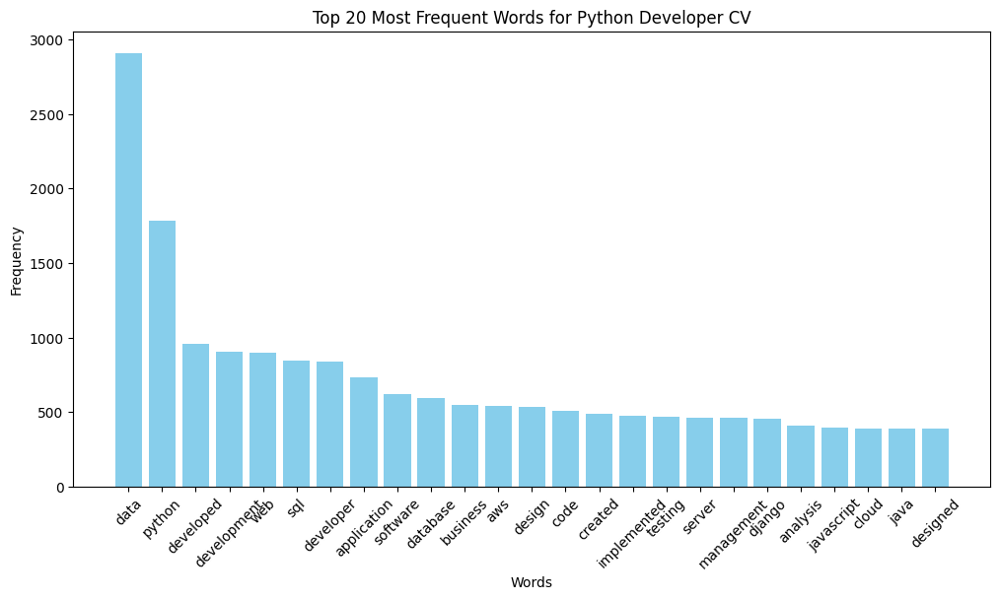

Top words for React Developer
['data', 'web', 'development', 'application', 'developed', 'developer', 'design', 'react', 'javascript', 'html', 'business', 'testing', 'spring', 'sql', 'management', 'code', 'java', 'implemented', 'software', 'server', 'created', 'database', 'framework', 'state', 'designed']
[1294, 1212, 1022, 964, 857, 757, 688, 670, 669, 580, 551, 514, 504, 500, 498, 482, 480, 480, 448, 436, 423, 393, 347, 333, 319]


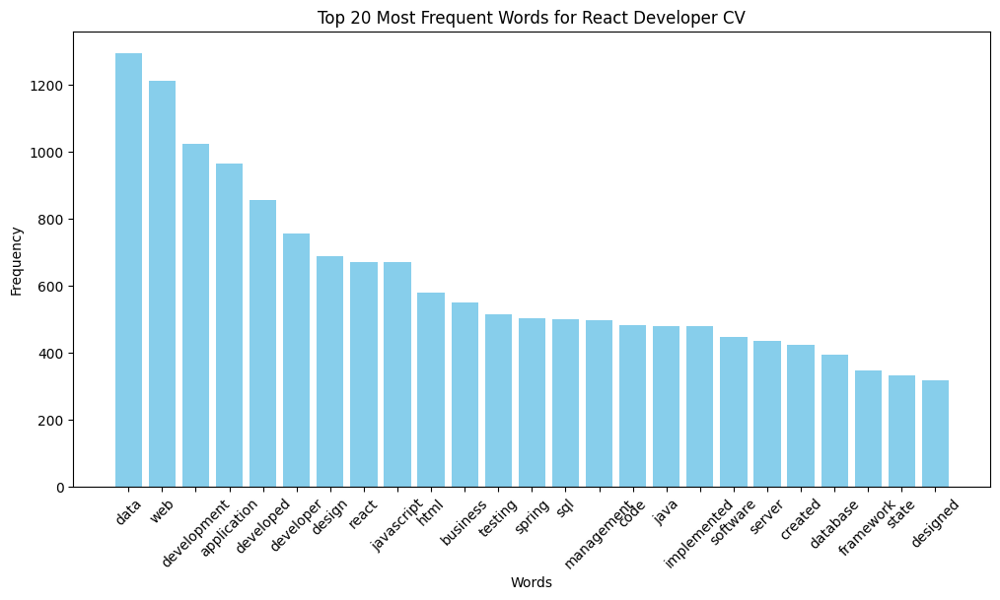

Top words for SAP Developer
['business', 'management', 'data', 'development', 'implementation', 'abap', 'analysis', 'consultant', 'testing', 'design', 'developed', 'master', 'state', 'integration', 'city', 'configuration', 'created', 'test', 'production', 'including', 'application', 'maintenance', 'planning', 'service', 'financial']
[1779, 1496, 1484, 861, 764, 725, 634, 633, 584, 579, 527, 520, 498, 475, 472, 465, 459, 401, 390, 382, 379, 350, 343, 342, 334]


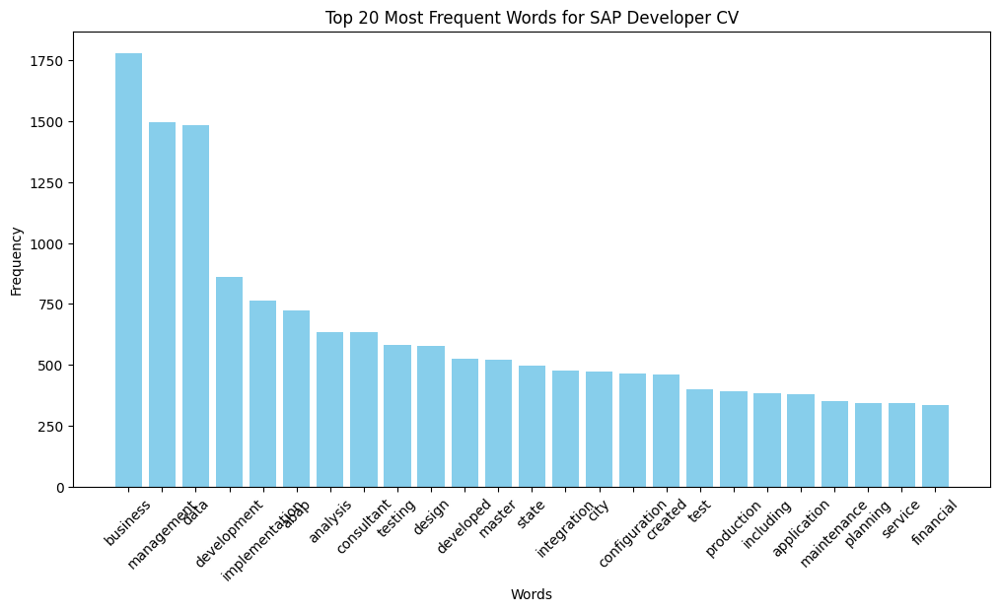

Top words for SQL Developer
['sql', 'data', 'server', 'database', 'ssis', 'business', 'development', 'developer', 'created', 'oracle', 'management', 'design', 'developed', 'production', 'stored', 'ssrs', 'tuning', 'analysis', 'security', 'microsoft', 'etl', 'application', 'recovery', 'monitoring', 'implemented']
[5767, 4254, 3941, 3938, 1235, 1228, 1135, 994, 976, 803, 778, 762, 757, 732, 727, 704, 701, 680, 677, 642, 599, 559, 537, 455, 450]


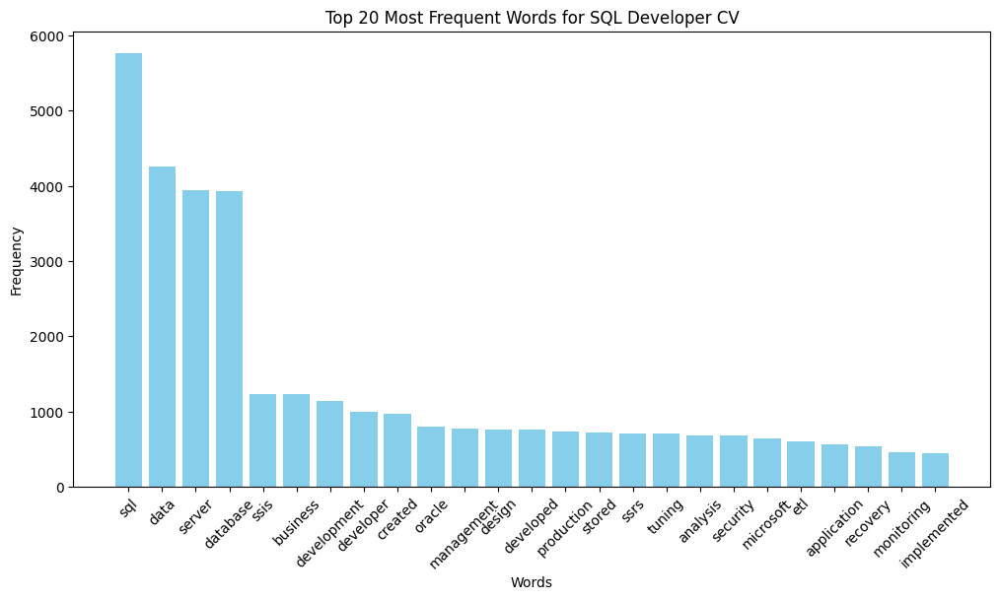

Top words for Sales
['service', 'management', 'business', 'professional', 'maintained', 'marketing', 'store', 'merchandise', 'development', 'revenue', 'inventory', 'state', 'current', 'communication', 'developed', 'staff', 'information', 'cash', 'daily', 'organized', 'city', 'market', 'equipment', 'account', 'satisfaction']
[1044, 850, 809, 544, 513, 454, 411, 381, 332, 328, 322, 318, 311, 310, 297, 296, 295, 286, 276, 269, 269, 261, 251, 242, 240]


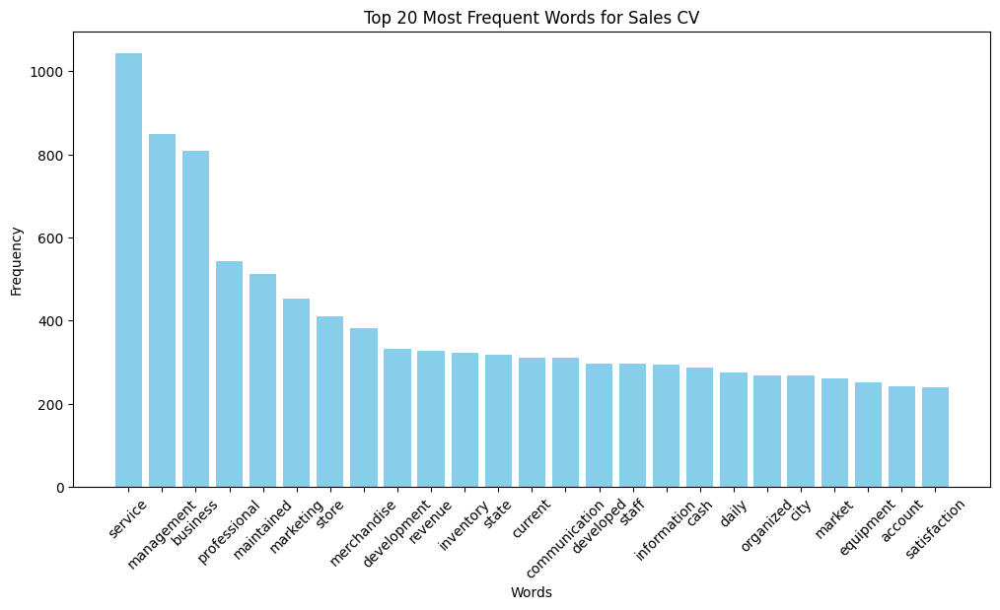

Top words for Testing
['testing', 'test', 'software', 'management', 'patient', 'data', 'care', 'state', 'development', 'information', 'business', 'city', 'security', 'staff', 'service', 'equipment', 'medical', 'professional', 'automation', 'maintained', 'science', 'including', 'current', 'developed', 'communication']
[2540, 1910, 833, 792, 721, 657, 595, 554, 544, 521, 448, 414, 404, 381, 376, 374, 373, 367, 331, 328, 310, 308, 300, 297, 292]


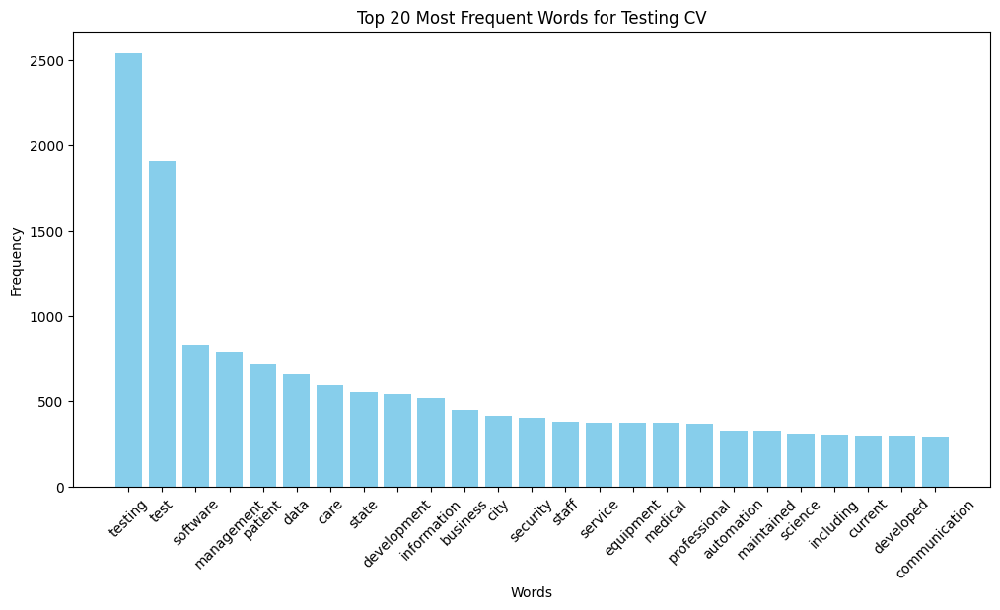

Top words for Web Designing
['web', 'design', 'development', 'website', 'management', 'developed', 'software', 'designer', 'marketing', 'developer', 'business', 'html', 'content', 'state', 'javascript', 'application', 'data', 'created', 'site', 'city', 'designed', 'service', 'testing', 'adobe', 'current']
[2179, 1264, 932, 761, 665, 557, 555, 538, 536, 521, 482, 478, 442, 427, 422, 422, 416, 416, 395, 379, 356, 344, 339, 317, 316]


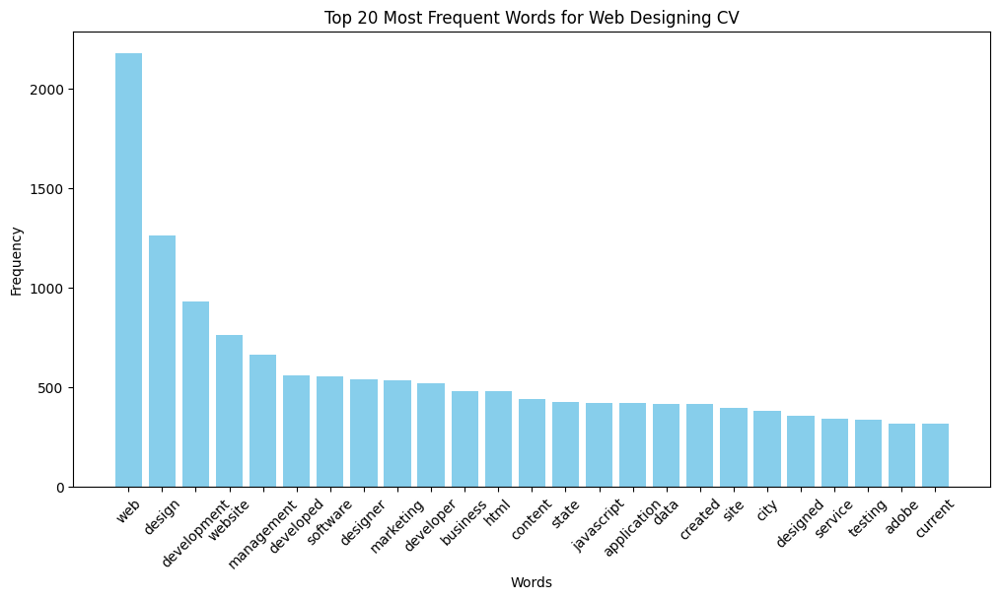

In [10]:
for category, words in category_word_freq.items():
    print(f"Top words for {category}")
    word,count = zip(*words)
    word,count = list(word),list(count)
    print(word)
    print(count)

    plt.figure(figsize=(12, 6))
    plt.bar(word, count, color='skyblue')
    plt.xticks(rotation=45)
    plt.title(f"Top {20} Most Frequent Words for {category} CV")
    plt.xlabel("Words")
    plt.ylabel("Frequency")
    plt.show()


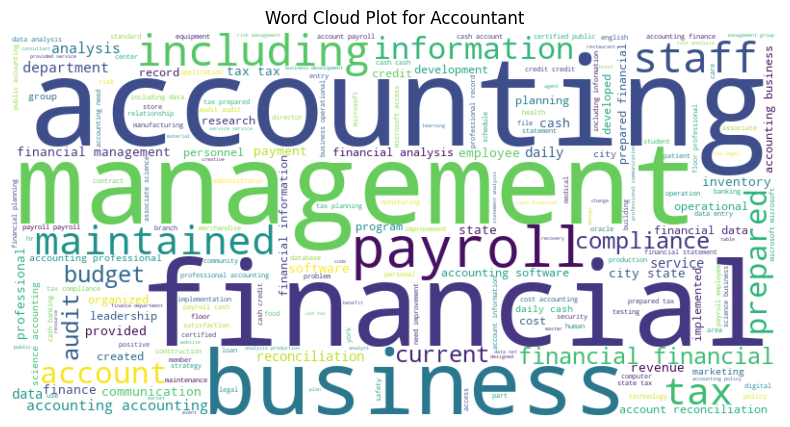

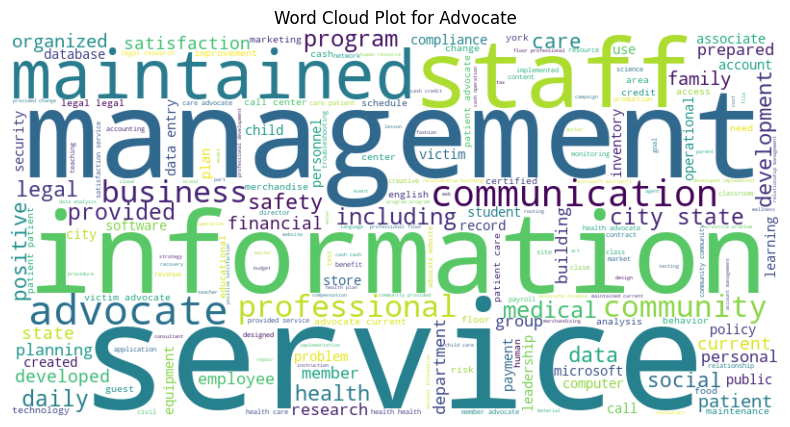

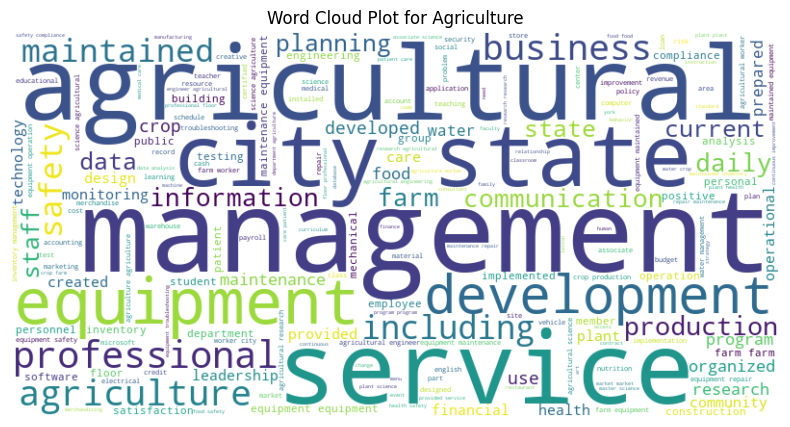

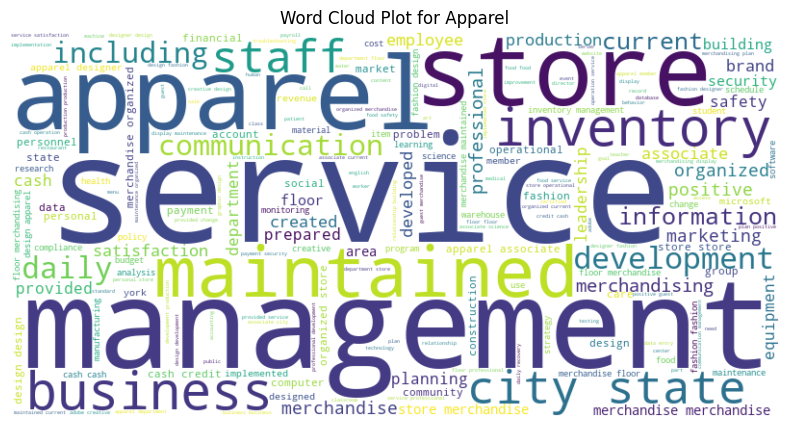

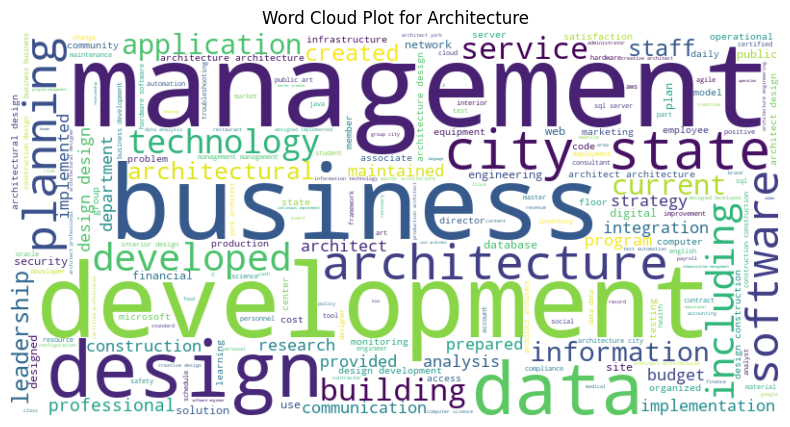

...

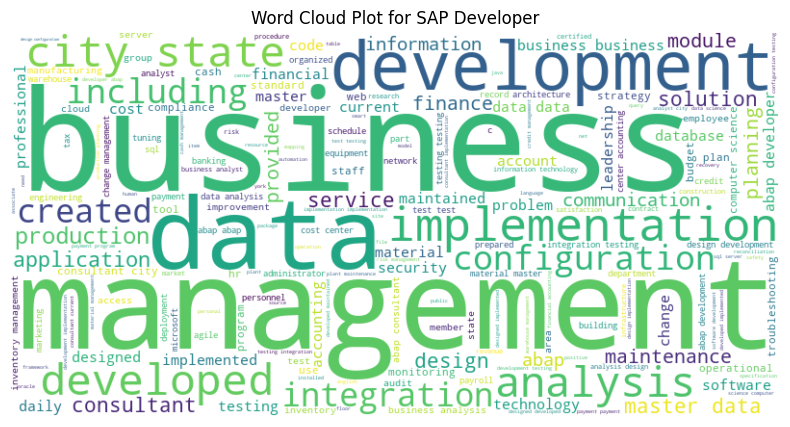

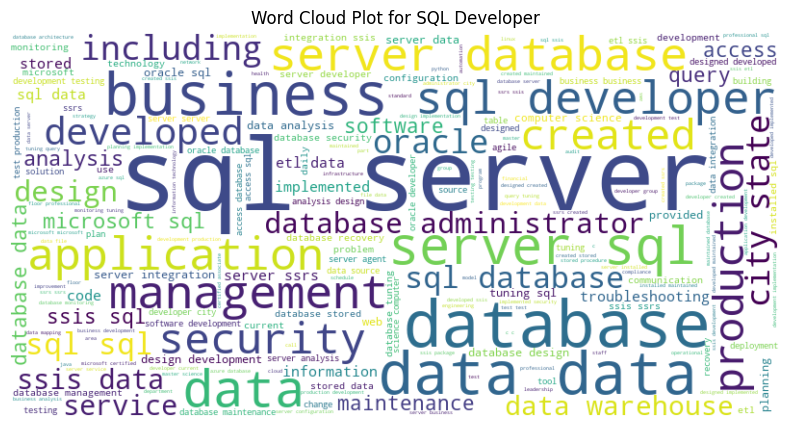

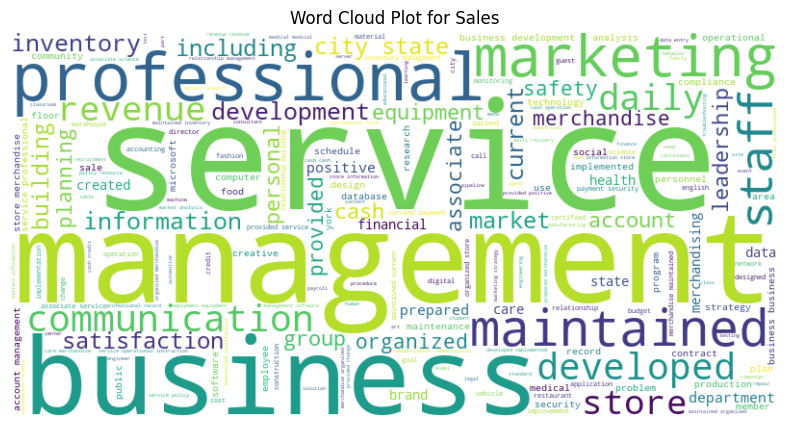

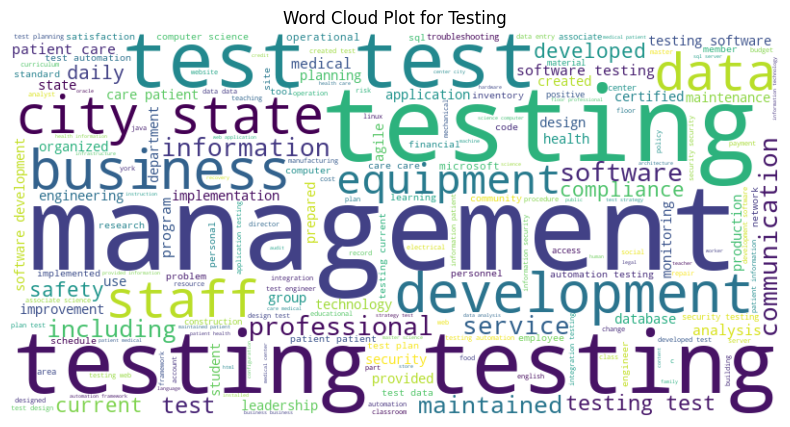

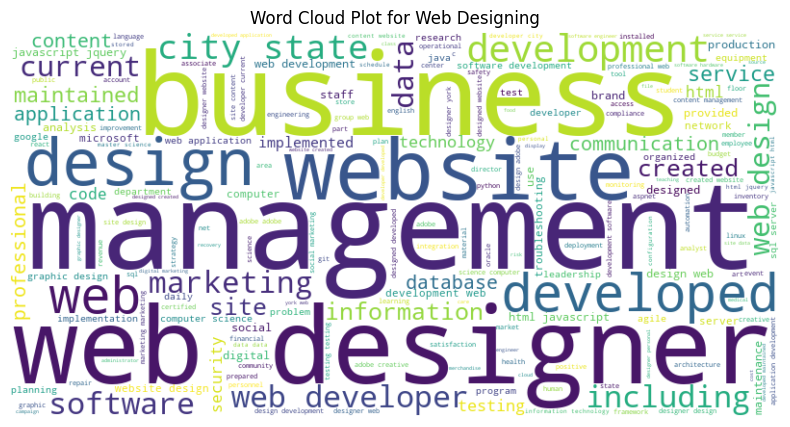

In [11]:
# generating word cloud
from wordcloud import WordCloud

def generate_word_cloud(text_data,Category):
    # Join the words to form a single large text
    text = " ".join(text_data)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud Plot for {Category}')
    plt.show()

for category, group in df.groupby('Category'):
    words = [w for words in group['Resume'] for w in words.split()]
    generate_word_cloud(words,category)

    # most_common_words = Counter(words).most_common(20)
    # category_word_freq[category] = most_common_words


In [12]:
# lets apply word2vec on the cleaned text

import gensim
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

# Tokenize the cleaned text
df['Tokenized_Resume'] = df['Resume'].apply(lambda x: word_tokenize(x))

# Create a Word2Vec model
model = Word2Vec(sentences=df['Tokenized_Resume'], vector_size=300, window=5, min_count=5, workers=4,epochs=10)

model.save("../models/word2vec_model.model")

# # To check the vector for a word
# word_vector = model.wv['company']  # Replace 'company' with any word in your dataset

# # To find most similar words
# similar_words = model.wv.most_similar('company', topn=5)
# print(similar_words)

df.head(3)

,Category,Resume,Category_Label,Tokenized_Resume
0,Accountant,leadership science accounting certified manage...,0,"[leadership, science, accounting, certified, m..."
1,Accountant,information financial business department dire...,0,"[information, financial, business, department,..."
2,Accountant,leadership state business accounting financial...,0,"[leadership, state, business, accounting, fina..."


In [13]:
df[df['Category'] == 'Mechanical Engineer'][['Resume']].head(10)

,Resume
1919,professional mechanical engineering student pr...
1920,management implemented food city state technol...
1921,mechanical engineering student engineering eng...
1922,mechanical engineer website mechanical enginee...
1923,mechanical engineer engineering engineering ma...
1924,mechanical engineer mechanical mechanical engi...
1925,mechanical engineering website maintenance mec...
1926,mechanical engineering website mechanical engi...
1927,mechanical engineer mechanical engineer data d...
1928,mechanical engineer personal software design m...


In [14]:
def get_average_word2vec(tokens,model,vector_size=300):
    word_vectors = [model.wv[word] for word in tokens if word in model.wv]

    if len(word_vectors) == 0:
        return np.zeros(vector_size)
    
    return np.mean(word_vectors,axis=0)

X = df['Tokenized_Resume'].apply(lambda x: get_average_word2vec(x,model))
features_vector_df = pd.DataFrame(X.tolist(),columns=[f'feature_{i}' for i in range(300)])
features_vector_df.head(2)

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_290,feature_291,feature_292,feature_293,feature_294,feature_295,feature_296,feature_297,feature_298,feature_299
0,0.194356,0.030597,0.217187,-0.059670,-0.215803,0.185366,-0.382862,-0.252451,-0.206439,0.241248,...,-0.079020,0.353891,0.172635,-0.037103,0.008928,-0.243548,0.200135,0.514957,0.009854,-0.066054
1,-0.227434,0.018535,0.160262,-0.158372,0.207646,-0.025545,-0.436192,0.158010,-0.640749,-0.163549,...,0.292897,0.140097,0.028223,-0.309077,-0.186836,-0.573684,-0.109458,0.666006,0.001550,-0.278537


In [15]:
labelled_data = {value: name for value, name in enumerate(le.classes_)}

for key,value in labelled_data.items():
    print(f'{key}: {value}')

0: Accountant
1: Advocate
2: Agriculture
3: Apparel
4: Architecture
5: Arts
6: Automobile
7: Aviation
8: BPO
9: Banking
10: Blockchain
11: Building and Construction
12: Business Analyst
13: Civil Engineer
14: Consultant
15: Data Science
16: Database
17: Designing
18: DevOps
19: Digital Media
20: DotNet Developer
21: ETL Developer
22: Education
23: Electrical Engineering
24: Finance
25: Food and Beverages
26: Health and Fitness
27: Human Resources
28: Information Technology
29: Java Developer
30: Management
31: Mechanical Engineer
32: Network Security Engineer
33: Operations Manager
34: PMO
35: Public Relations
36: Python Developer
37: React Developer
38: SAP Developer
39: SQL Developer
40: Sales
41: Testing
42: Web Designing


In [16]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(features_vector_df,df['Category_Label'],test_size=0.3,random_state=32)

In [17]:
X_train.shape

(9372, 300)

### Model Training

In [18]:
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, roc_auc_score, precision_score, recall_score

models = {
    "SVC": SVC(),
    # "NaiveBayes": MultinomialNB(),
    "XGBoost": XGBClassifier(),
    "Decision_Tree": DecisionTreeClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    'GradientBoosting': GradientBoostingClassifier(),
    "KNN": KNeighborsClassifier(),
    "Random_Forest": RandomForestClassifier(),
    "Logistic_Regression": LogisticRegression()
}

In [19]:
n = len(models)

for key,value in models.items():
    model = value 
    model.fit(X_train,y_train)

    # make predictions 
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Trained Data performance
    model_train_acc = accuracy_score(y_train, y_train_pred)
    model_train_f1 = f1_score(y_train, y_train_pred, average="weighted")  # Specify 'weighted', 'macro', or 'micro'
    model_train_precision = precision_score(y_train, y_train_pred, average="weighted")
    model_train_recall = recall_score(y_train, y_train_pred, average="weighted")


    # Test Data performance 
    model_test_acc = accuracy_score(y_test,y_test_pred)
    model_test_f1 = f1_score(y_test,y_test_pred, average='weighted')
    model_test_precision = precision_score(y_test,y_test_pred, average='weighted')
    model_test_recall = recall_score(y_test,y_test_pred, average='weighted')

    print(f"Model: {key}")

    print("Model Performance for Training set")
    print("- Accuracy: {:.4f}".format(model_train_acc))
    print("- F1-Score: {:.4f}".format(model_train_f1))
    print("- Precision: {:.4f}".format(model_train_precision))
    print("- Recall: {:.4f}".format(model_train_recall))

    print()

    print("Model Performance for Test set")
    print("- Accuracy: {:.4f}".format(model_test_acc))
    print("- F1-Score: {:.4f}".format(model_test_f1))
    print("- Precision: {:.4f}".format(model_test_precision))
    print("- Recall: {:.4f}".format(model_test_recall))

    print("-----------------------------------------------------------------------------------------------------------------")


Model: SVC
Model Performance for Training set
- Accuracy: 0.7645
- F1-Score: 0.7608
- Precision: 0.7676
- Recall: 0.7645

Model Performance for Test set
- Accuracy: 0.7067
- F1-Score: 0.7032
- Precision: 0.7122
- Recall: 0.7067
-----------------------------------------------------------------------------------------------------------------
Model: XGBoost
Model Performance for Training set
- Accuracy: 0.9885
- F1-Score: 0.9884
- Precision: 0.9885
- Recall: 0.9885

Model Performance for Test set
- Accuracy: 0.7277
- F1-Score: 0.7283
- Precision: 0.7322
- Recall: 0.7277
-----------------------------------------------------------------------------------------------------------------
Model: Decision_Tree
Model Performance for Training set
- Accuracy: 0.9882
- F1-Score: 0.9879
- Precision: 0.9886
- Recall: 0.9882

Model Performance for Test set
- Accuracy: 0.5639
- F1-Score: 0.5649
- Precision: 0.5705
- Recall: 0.5639
--------------------------------------------------------------------------

In [27]:
# SVC params

svc_params = {
    'kernel': ['poly', 'rbf', 'sigmoid'],
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01], 
    'degree': [3,4,5]       
}

xgb_params = {
    'max_depth': [7,9,11,13],
    'min_child_weight': [3,5,7,9],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}

rf_params = {
    'n_estimators': [50,100,200,500],
    'max_depth': [8,10,12],
    'max_features': ['sqrt','log2']
}

grdb_params = {
    'min_samples_leaf': [3,5,7,9],
    'max_depth': [7,9,11,13],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
}

# models list for hyper-parameter tuning
cv_models = [
    # ("SVC",SVC(),svc_params),
    ("XGBoost",XGBClassifier(use_label_encoder=False),xgb_params),
    # ("RandomForest",RandomForestClassifier(),rf_params),
    # ("GradientBoost",GradientBoostingClassifier(),grdb_params),
] 

In [30]:
from sklearn.model_selection import GridSearchCV

tuned_model = {}
model_params = {}

for name, model, params in cv_models:
    gridSearchCV = GridSearchCV(estimator=model,param_grid=params,cv=3,verbose=1,refit=True,n_jobs=-1)
    tuned_model[name] = gridSearchCV

    gridSearchCV.fit(X_train,y_train)
    model_params[name] = gridSearchCV.best_params_ 


Fitting 3 folds for each of 144 candidates, totalling 432 fits


In [31]:
for name, param in model_params.items():
    print("-----------------------------------------------------------------------------------\n")
    print(f"For {name}")
    print(param)
    print()

-----------------------------------------------------------------------------------

For XGBoost
{'learning_rate': 0.2, 'max_depth': 11, 'min_child_weight': 5, 'n_estimators': 200}



In [32]:
print("Best Tunned Models: \n")

for name,model in tuned_model.items():

    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    # Trained Data performance 
    model_train_acc = accuracy_score(y_train,y_train_pred)
    model_train_f1 = f1_score(y_train, y_train_pred, average="weighted")  # Specify 'weighted', 'macro', or 'micro'
    model_train_precision = precision_score(y_train, y_train_pred, average="weighted")
    model_train_recall = recall_score(y_train, y_train_pred, average="weighted")
    
    # Test Data performance 
    model_test_acc = accuracy_score(y_test,y_test_pred)
    model_test_f1 = f1_score(y_test,y_test_pred, average='weighted')
    model_test_precision = precision_score(y_test,y_test_pred, average='weighted')
    model_test_recall = recall_score(y_test,y_test_pred, average='weighted')

    print(f"Model: {name}")

    print("Model Performance for Training set")
    print("- Accuracy: {:.4f}".format(model_train_acc))
    print("- F1-Score: {:.4f}".format(model_train_f1))
    print("- Precision: {:.4f}".format(model_train_precision))
    print("- Recall: {:.4f}".format(model_train_recall))

    print()

    print("Model Performance for Test set")
    print("- Accuracy: {:.4f}".format(model_test_acc))
    print("- F1-Score: {:.4f}".format(model_test_f1))
    print("- Precision: {:.4f}".format(model_test_precision))
    print("- Recall: {:.4f}".format(model_test_recall))

    print("-----------------------------------------------------------------------------------------------------------------")    



Best Tunned Models: 

Model: XGBoost
Model Performance for Training set
- Accuracy: 0.9884
- F1-Score: 0.9883
- Precision: 0.9884
- Recall: 0.9884

Model Performance for Test set
- Accuracy: 0.7376
- F1-Score: 0.7355
- Precision: 0.7369
- Recall: 0.7376
-----------------------------------------------------------------------------------------------------------------


In [33]:
# so we will choose gradient boost model
import os
import pickle

save_path = "../models"
os.makedirs(save_path, exist_ok=True)

gb_model_path = os.path.join(save_path, "word2vec_XGBoost_model.pkl")
with open(gb_model_path, 'wb') as file:
    pickle.dump(tuned_model['XGBoost'], file)

label_encoder_path = os.path.join(save_path, "label_encoder2.pkl")
with open(label_encoder_path, 'wb') as file:
    pickle.dump(le, file)